# Extended Convergent Cross Mapping (ECCM) Algorithm on Toy Examples from Ping' Thesis
Causality detection toy examples from Ping's thesis were revisited using ECCM.

***

## Section 0: Environment Setup

### Import relevant packages

In [1]:
# Import numerical packages
import numpy as np
import pandas as pd
import math

# Discrete transfer function signal simulation
from scipy import signal

# For creating permutations of variable pairs
import itertools

# For variable memory debugging
from sys import getsizeof

# Regex functions
import re

# Display DataFrames mid-script
from IPython.display import display

# Plot.ly visualisations
import plotly
import plotly.plotly as py
import plotly.offline as pyo # Plot.ly visualisations
import plotly.graph_objs as go # Plot.ly visualisations

# Directed graph visualisations
import graphviz

# Ignore warnings when copying a filtered DataFrame
import warnings
warnings.filterwarnings('ignore')

### Configure environment

In [2]:
%config InlineBackend.figure_format = 'retina'
np.set_printoptions(precision=3)

# Activate Plotly Offline for Jupyter
pyo.init_notebook_mode(connected=True)

### Define helper functions

In [3]:
def generate_delayed_df(df, embedDim, delay=1):
    '''
    Generate a delayed dataframe of `embedDim` dimensions, each phase-shifted by `delay` delay.

    Input:
        df:         Panda dataframe
        embedDim:  Embedding dimensions (int)
        delay:      Number of samples between each time series point (int)
        
    Returns:
        A multiLevel dataframe.
    '''
    # Obtain rows of dataframe
    N = len(df)
    
    assert embedDim > 1
    assert delay >= 1
    
    # Define empty dataframe
    output = pd.DataFrame()
    
    # Define empty list for column headers
    column_headers = []
    
    # Create d duplicates of each time-series, and shift duplicated time-series by 'delay' sampling intervals
    for field, series in df.iteritems():
        for i in range(embedDim):
            output = pd.concat([output, series.shift(- i * delay)], axis=1)

            # Create multiLevel header
            column_headers.append((field, str(i)))
    
    # Add column headers to dataframe
    output.columns = pd.MultiIndex.from_tuples(column_headers)
    
    # Removes rows containing NaN 
    # Reset index to start from 0
    processed_output = (output
                        .dropna()
                        .reset_index(drop=True))
        
    return processed_output

def min_max_normalise(df, minVal=0, maxVal=1, minMaxRange=None):
    '''
    Perform min-max normalisation to columns within each DataFrame.
    
    Inputs:
        df: A Pandas DataFrame.
        minVal: Minimum output value.
        maxVal: Minimum output value.
        minMaxRange: 
            Range from which to sample minimum and maximum values 
            (array of [minIndex, maxIndex]). If 'heuristic' is used, 
            follow ECCM wrapper heuristic of using last 25% or last 
            1000 points, whichever is lower.
            
            Default is None, and entire range of values used in sampling.
    
    Returns a min-max normalized DataFrame.
    '''
    if minMaxRange == None:
        _df = df
    elif minMaxRange == 'heuristic':
        _df = df[-min(1000, int(0.25 * len(df))):]
    else:
        _df = df[minMaxRange[0]:minMaxRange[1]]

    return (df - _df.min()) * (maxVal - minVal) / (_df.max() - _df.min()) + minVal

def standardise(df, standardizeRange=None):
    
    if standardizeRange == None:
        _df = df
    elif standardizeRange == 'heuristic':
        _df = df[-min(1000, int(0.25 * len(df))):]
    else:
        _df = df[standardizeRange[0]:standardizeRange[1]]
    
    return (df - _df.mean()) / _df.std()

def scatter_plot(legends, *args):
    '''
    Create a 2D or 3D scatter plot corresponding 
    to the length of `legends`.
    
    The length of `legends` has to be the same as 
    the lenght of `args`
    
    '''
    assert len(legends) == len(args)
    
    if len(args) == 2:
        data = go.Data([go.Scattergl(
            x = args[0],
            y = args[1],
            mode = 'markers',
            marker = {'size': 2}
        )])
        
        layout = go.Layout(
            height = 400,
            width = 600,
            margin = {'t': 0},
            xaxis = {'title': legends[0]},
            yaxis = {'title': legends[1]}
        )
    elif len(args) == 3:
        data = go.Data([go.Scatter3d(
            x = args[0],
            y = args[1],
            z = args[2],
            mode = 'markers',
            marker = {'size': 2}
        )])
        
        layout = go.Layout(
            height = 800,
            width = 800,
            margin = {'t': 0},
            scene = {
                'xaxis': {'title': legends[0]},
                'yaxis': {'title': legends[1]},
                'zaxis': {'title': legends[2]},
            }
        )
    else:
        raise
    
    pyo.iplot(go.Figure(data=data, layout=layout))

def multiple_scatter(legends, *args):
    remainingArgs = args[1:]
    
    # Define number of remaining arguments as N
    N = len(remainingArgs)
    
    figure = plotly.tools.make_subplots(N, 1, 
                                        print_grid = False,
                                        shared_xaxes = True,
                                        vertical_spacing = 0.05)
    
    # Add traces
    for (i, (legend, var)) in enumerate(zip(legends, remainingArgs)):
        trace = go.Scatter(
            x = args[0],
            y = var,
            name = legend,
            marker = {'size': 2}
        )
        
        figure.append_trace(trace, i + 1, 1)
    
    
    # Update layout
    figure['layout'].update(
        height = 200 * N,
        width = 800,
        margin = {'t': 0},
        showlegend = False,
    )
    
    # Add layout axes titles
    for (i, legend) in enumerate(legends):
        figure['layout']['yaxis{}'.format(i + 1)].update(
            title = legend,
        )
    
    # Create figure
    pyo.iplot(figure)

def plot_causalities(causalities):
    def _check_assertions(causalities):
        '''
        Perform assertion checks on `causality` input
        '''
        # Check if causalities is a Pandas DataFrame
        assert isinstance(causalities, pd.DataFrame)
        
        # Check if there are odd numbers of cross map lags
        assert len(causalities) % 2 == 1
    
    # Check validity of input data
    _check_assertions(causalities)
    
    # Obtain x-domain to plot
    xmapLags = causalities.index.values
    
    # Define number of traces to plot
    N = len(list(causalities))
    
    figure = plotly.tools.make_subplots(N, 1, 
                                        print_grid = False,
                                        shared_xaxes = False)
    
    # Add traces
    for (i, (title, series)) in enumerate(causalities.iteritems()):
        trace = go.Scatter(
            x = xmapLags,
            y = series,
            name = title,
            marker = {'size': 2}
        )
        
        figure.append_trace(trace, i + 1, 1)
    
    
    # Update layout
    figure['layout'].update(
        height = 200 * N,
        width = 800,
        margin = {'t': 0},
        showlegend = False,
    )
    
    # Adjust y-axis titles and ranges
    for (i, (title, series)) in enumerate(causalities.iteritems()):
        figure['layout']['yaxis{}'.format(i + 1)].update(
            title = title,
            range = [min(np.append(series, 0)), 1],
        )
    
    # Create figure
    pyo.iplot(figure)

def PCA_and_scatter_plot(DF):
    '''
    Performs PCA on a DF matrix of shape N x D,
    and plots it along its 3-largest principal 
    components.
    
    N is the number of datapoints, while D is 
    the number of variables in the DF, such 
    that N >> D.
    
    Inputs:
        DF: A DF containing the states of the 
            object. Do not supply a time-delay
            embedded DF here.
    
    Returns:
        An interactive 3D Plotly scatterplot.
    '''
    
    assert len(list(DF)) >= 3
    
    # Obtain the square matrix (D x D)
    covMat = np.matmul(DF.T, DF)
    
    # Calculate the eigenvalues and eigenvectors
    eigvals, eigvect = np.linalg.eig(covMat)
    
    # Find the sorted indices in decreasing order
    sortedIndex = np.argsort(-eigvals)
    
    # Obtain the top 3 sorted eigenvectors
    sortedEigVect = np.zeros((DF.shape[1], 3))
    
    for i in range(3):
        sortedEigVect[:, i] = eigvect[:, sortedIndex[i]]
        
    # Calculate the scores corresponding to the top
    # 3 principal components
    zscores = np.matmul(DF, sortedEigVect)
    
    # Plot on plotly
    data = go.Data([go.Scatter3d(
        x = zscores[:, 0],
        y = zscores[:, 1],
        z = zscores[:, 2],
        mode = 'markers',
        marker = {'size': 2},
        hoverinfo = 'text',
        text = ['PC1: {}<br>PC2: {}<br>PC3: {}'.format(zscore[0], zscore[1], zscore[2]) for zscore in zscores]
    )])
        
    layout = go.Layout(
        height = 800,
        width = 800,
        margin = {'t': 0},
        scene = {
            'xaxis': {'title': 'PC1'},
            'yaxis': {'title': 'PC2'},
            'zaxis': {'title': 'PC3'},
        }
    )
    
    pyo.iplot(go.Figure(data=data, layout=layout))
    
def create_digraph(df, threshold=0.5, criterion='URC', orientation='LR', label=None, filename=None, directory=None):
    '''
    Create a directed graph visualisation, and optionally save a PDF of graph.
    
    Inputs:
        df:          Pandas DataFrame containing peaks
        threshold:   Value to consider causality significant.
        criterion:   Criterion to filter peaks ('URC' or 'Peak')
        orientation: Graph display orientation ('LR' or 'UD')
        filename:    Name of file to save
        directory:   Directory to save file
        
    Returns:
        A graphviz Digraph object.
    '''
    def _causality_to_width(val, threshold):
        '''
        Helper function that maps a causality index to 
        a certain edge width.
        
        Input:
            val: A float between `threshold` and 1.
        '''
        # Define number of possible divisions
        N = 3
        divisions = [i * (1 - threshold) / 3 + threshold for i in range(N)]
        
        return sum(map(lambda x: x < val, divisions))
        
        
    # Create Boolean to track whether to save image as PDF
    saveImage = False
    
    # Check assertions
    if (filename is not None) or (directory is not None):
        assert filename is not None
        assert directory is not None
        saveImage = True
    
    # Create digraph instance
    dot = graphviz.Digraph(format='pdf')
    
    # Set graph orientation and size
    dot.attr(rankdir=orientation)
    dot.attr('graph', size='(3,3)')
    dot.attr('graph', label=label if not label == None else '')

    # Define edges
    posLinks = df[((df['{} Causality'.format(criterion)] >= threshold) \
                   & (df['{} xMap Lag'.format(criterion)] < 0))]
    
    # Ends prematurely if DataFrame is empty
    if posLinks.empty:
        print 'Filtered DataFrame is empty. No graphs to display.'
        return
    
    # Define set of connected nodes
    varSet = set(reduce(list.__add__, map(lambda x: re.split(' → ', x), list(posLinks.index))))

    # Add nodes to graph
    [dot.node(var, var) for var in varSet]

    # Add edges to graph
    for edge in posLinks.index:
        source, dest = re.split(' → ', edge)
        dot.edge(source, 
                 dest, 
                 label=str(int(-posLinks.loc[edge, '{} xMap Lag'.format(criterion)])))

    # Output PDF file (optional)
    if saveImage:
        dot.render(filename=filename, 
                   directory=directory, 
                   cleanup=True)
        
    return dot
    
def extCCM_wrapper(DF, crossMapLags=5, useAllPoints=False):
    '''
    A wrapper function for the Extended CCM algorithm, to handle
    repetitive variable-pair manipulations. Uses the last 25% of
    datapoints or 1,000 points, whichever is lower, to run ECCM.
    
    Inputs:
        DF:           A Pandas DataFrame containing the time series variables.
        crossMapLags: Range of cross map lags to calculate 
                      [-`crossMapLags`, `crossMapLags` + 1]
        useAllPoints: Boolean. If True, use all points for ECCM calculation. 
                      Otherwise, use the last 25% of datapoints or 1,000 points, 
                      whichever is lower,
    
    Returns:
        causalitiesDF:    A DataFrame of calculated causalities for 
                          each variable-pair.
        causalityPeaksDF: A DataFrame containing the coordinates of
                          the causality peaks for each variable-pair.
    '''
    def _URC_cross_map_lags(DF):
        '''
        Calculate the critical cross map lag of each causality series 
        baed on the Upper Right Corner (URC) criteria.
        
        Critical cross map lag is defined as the cross map lag before
        the lag corresponding to the maximum discrete concativity.
        Concativity can be calculated using discrete first- and second-
        order derivatives.
        
        Inputs:
            DF: An (N x P) DataFrame containing causalities for P 
                variable pairs at N cross map lags.
        
        Returns:
            A (P* x 1) DataFrame containing the critical URC cross map
            lags, where 0 <= P* <= P. 
        '''
        # Concatenate first- and second-order derivatives into a 
        # DataFrame with keys 'delta' and 'doubleDelta'
        _derivAllVarsDF = pd.concat([DF.diff(2).shift(-1)/2, DF.shift(-1) + DF.shift(1) - 2 * DF], 
                                    axis=1, 
                                    keys=['delta', 'doubleDelta'])
        
        # Create a list to store critical URC cross maps
        URCLags = []
        
        # Iterate through every variable pair
        for key in DF.columns:
            # Create a (N x 2) DataFrame containing the 
            # first- and second- order derivative of 
            # a single variable pair
            _derivSingleVarDF = _derivAllVarsDF.loc[:, _derivAllVarsDF.columns.get_level_values(1) == key]
            
            # Calculate critical cross map lag
            # 1. Filter values in _df which are strictly nonpositive
            # 2. Drop rows that contain do not match filter criteria
            # 3. Select 'doubleDelta' column
            # 4. Obtain index of minimum 'doubleDelta' less one,
            #    as a Pandas Series
            try:
                critXMapLag = ((_derivSingleVarDF[_derivSingleVarDF.apply(lambda x: x <= 0)])
                               .dropna())['doubleDelta'].idxmin()
            except ValueError:
                critXMapLag = pd.Series(None, index=[key])
            
            # Append critical lags to `URCLags`
            URCLags.append(critXMapLag)

        # Create DataFrame of critical lags
        return pd.DataFrame(pd.concat(URCLags), columns=['URC xMap Lags'])
    
    def _peak_causality_coordinates(DF):
        '''
        Calculate the coordinate of causality peak
        for each variable pair in DF. 

        Returns a Pandas DataFrame. 
        '''
        # Create a new Pandas DataFrame
        peakCausalitiesDF = pd.DataFrame()

        # Calculate peak causalities
        peakCausalitiesDF['Peak Causality'] = DF.max().round(3)

        # Obtain peak cross map lag
        peakCausalitiesDF['Peak xMap Lag'] = DF.idxmax()
        
        # Calculate Upper Right Corner (URC) cross map lag
        peakCausalitiesDF['URC xMap Lag'] = _URC_cross_map_lags(DF)
        
        # Calculate URC Causality
        URCCausalities = []
        for (index, value) in peakCausalitiesDF['URC xMap Lag'].iteritems():
            # If cross map lag is None, causality is also None
            URCCausalities.append(None if pd.isnull(value) else round(DF.loc[value, index], 3))
        peakCausalitiesDF['URC Causality'] = pd.Series(URCCausalities, index=peakCausalitiesDF.index)

        # Rearrange columns and return DataFrame
        return peakCausalitiesDF[['Peak Causality', 
                                  'Peak xMap Lag',
                                  'URC Causality',
                                  'URC xMap Lag']]
    
    # Calculate length of datapoints to use
    N = min(int(0.25 * len(DF)), 1000) if useAllPoints == False else len(DF)
    
    # Ensure that there are sufficient points to perform ECCM
    assert N > crossMapLags + 3 # Default kNN hyperparameter = 3 in CCM function
    
    # Create empty DataFrame to store results
    causalitiesDF = pd.DataFrame()
    
    # Run Extended CCM algorithm
    for (source, target) in itertools.permutations(DF.columns, 2):
        causalitiesDF['{} → {}'.format(target, source)] = \
            extCCM(DF[-N:], 
                   sourceCol=source, 
                   targetCol=target,
                   embedDim=len(DF.columns),
                   crossMapLags=crossMapLags
                  )

    # Add 'Cross Map Lag' as DataFrame index
    causalitiesDF['xMap Lag'] = range(-crossMapLags, crossMapLags + 1)
    causalitiesDF.set_index('xMap Lag', inplace=True)
    
    peaksDF = _peak_causality_coordinates(causalitiesDF)
    
    return causalitiesDF, peaksDF

def visualise_results(statesDF, causalitiesDF, peaksDF, threshold=0.5):
    '''
    Visualise result of ECCM algorithm, by plotting the
    time series, state-space, causalities plot and a
    DataFrame of the causality peaks.
    '''
    # Visualise time series
    print 'System Time Series'
    multiple_scatter(statesDF.columns, 
                     range(len(statesDF)), 
                     *statesDF.values.T)
    
    # Visualise attractor
#     print '\n\n\nState Space Plot'
#     if len(statesDF.columns) > 3:
#         PCA_and_scatter_plot(statesDF)
#     else:
#         scatter_plot(statesDF.columns, *statesDF.values.T)
        
    
    # Visualise ECCM results
    print '\n\n\nExtended CCM results'
    plot_causalities(causalitiesDF)

    # Display causality peaks
    display(peaksDF[((peaksDF['Peak Causality'] >= threshold) \
                    &   (peaksDF['Peak xMap Lag'] < 0)) \
                    | ((peaksDF['URC Causality'] >= threshold) \
                    & (peaksDF['URC xMap Lag'] < 0))])
    
    # Create graph visualisation
    display(create_digraph(peaksDF))

### Define CCM algorithm

In [4]:
def CCM(DF, dataCol, targetCol, k=3, attractor_viz=False, prediction_corr_viz=False):
    '''
    Perform convergent cross-mapping (CCM) algorithm described in paper.
    Inputs:
        DF:     A Pandas DataFrame
        data:   A string corresponding to data column in DF to perform k-NN
        target: A string corresponding to target column in DF to perform prediction
        k:      Number of nearest neighbours (scalar)
    Returns:
        predictions: Predicted values (1-D array)
        causality:   Calculated causality from correlation plot (float)
    '''
    def euclidean_dist(A, B=None):
        '''
        Calculate the euclidean distance for rows in matrix A and rows in matrix B.
        If B is None, calculate distances for rows between matrix A.
        Inputs:
            A: A matrix (a x P)
            B: A matrix (b x k x P)
        Returns:
            A distance matrix (a x b), indicating the distance of all non-i-th point to the i-th point. 
        ''' 
        # Define input matrices with expanded dimensions
        A_expanded = np.expand_dims(A, 2)
        
        # Epsilon term for numerical stability
        epsilon = 1e-9
        
        # Calculate distance of each point and every other point
        if B is None:
            return np.sqrt(np.sum(np.square(A_expanded - np.transpose(A_expanded, (2, 1, 0))), axis=1)) + epsilon
        else:
            return np.sqrt(np.sum(np.square(np.transpose(A_expanded, (0,2,1)) - B), axis=2)) + epsilon
   
    def kNN(k, data):
        '''
        Return the nearest neighbours to each row in data in the form of a responsibility matrix.
        Inputs:
            k:    Number of nearest neighbours (scalar)
            data: Data to perform k-NN, a numpy array (N x P)
        Returns:
            A responsibility matrix (N x k), listing the indices of the k-nearest neighbours for each row
        '''

        def responsibilities(k, distances):
            '''
            Finds the k-nearest neighbours to each point by index.
            Inputs:
                k:         Number of nearest neighbours (scalar)
                distances: A distance matrix (N x N)
            Returns:
                A responsibility matrix (N x k), listing the indices of the k-nearest neighbours for each row
            '''
            return np.argsort(distances)[:,1:(k + 1)]

        return responsibilities(k, euclidean_dist(data))

    def predict_target(data, target, responsibilities):
        '''
        Performa a prediction of the target based on a weighting of contemporaneous neighbours of data.
        Inputs:
            data:             Data values (N x P)
            target:           Target values to perform prediction (N x P)
            responsibilities: A responsibility matrix (N x k)
        Returns:
            An array of predicted target values (N)
        '''

        def calculate_weights(data, responsibilities):
            '''
            Calculate weights based on the k-nearest neighbours
            Inputs:
                data:             Data values (N x P)
                responsibilities: A responsibility matrix (N x k)
            Returns:
                A matrix of weights (N x k)
            '''
            # Obtain shape of responsibilities
            N, k = responsibilities.shape

            # Calculate values for numerator
            for i in range(k):
                numerator = np.exp( - np.divide(euclidean_dist(data, data[responsibilities]), \
                                                euclidean_dist(data, data[responsibilities])[:,0][:, np.newaxis]))

            # Calculate denominator
            denominator = np.sum(numerator, axis=1, keepdims=True)

            # Calculate and return weights
            return np.divide(numerator, denominator)
        
        weights = calculate_weights(data, responsibilities)
        return np.sum(target[responsibilities] * np.expand_dims(weights, axis=2), axis=1)
    
    def L2_score(target, prediction):
        '''
        Calculate the L2 distance between the min-max normalised values of target and prediction values.
        
        Inputs:
            target: An array of target values
            prediction: An array of prediction values
            
        Output:
            Min-max normalised average L2 distance of target-prediction pairs.
        '''
        assert len(target) == len(prediction)
        
        _combinedVars = np.append(target, prediction)
        target = (target - min(_combinedVars)) / (max(_combinedVars) - min(_combinedVars))
        prediction = (prediction - min(_combinedVars)) / (max(_combinedVars) - min(_combinedVars))
        
        return np.sqrt(1. / (len(target)) * np.sum((target - prediction)**2))
    
    def visualise_predictions(targetDict, predictionsDict):
        '''
        Create a scatterplot visualising predictions vs. target.
        Inputs:
            target:      Target values (N x P)
            predictions: Prediction values (N x P)
        '''
        figure = plotly.tools.make_subplots(1, 2, print_grid=False, 
                                            subplot_titles=['{0} → {1} (rho = {2})<br>{3:.3f}'\
                                                            .format(targetCol, 
                                                                    dataCol, 
                                                                    np.round(np.corrcoef(targetDict[targetCol][:,-1], 
                                                                                         predictionsDict[targetCol][:,-1])[0,-1], 3),
                                                                    L2_score(targetDict[targetCol][:, -1], predictionsDict[targetCol][:, -1])),
                                                            '{0} → {1} (rho = {2})<br>{3:.3f}'\
                                                            .format(dataCol, 
                                                                    targetCol, 
                                                                    np.round(np.corrcoef(targetDict[dataCol][:,-1], 
                                                                                         predictionsDict[dataCol][:,-1])[0,-1], 3),
                                                                    L2_score(targetDict[dataCol][:, -1], predictionsDict[dataCol][:, -1])),
                                                           ])
        
        for n in range(2):
            varCols = [dataCol, targetCol]
        
            unReconstrVar = varCols[n]
            reconstrVar = varCols[1 - n]
            
            target = targetDict[reconstrVar]
            predictions = predictionsDict[reconstrVar]
            
            trace = go.Scattergl(
                x = target[:,-1],
                y = predictions[:,-1],
                mode = 'markers',
                hoverinfo = 'text',
                text = [str(i) for i in range(len(target))]
            )

            combined_data = np.append(target, predictions)

            line_trace = go.Scattergl(
                x = [np.min(combined_data), np.max(combined_data)],
                y = [np.min(combined_data), np.max(combined_data)],
                mode = 'lines',
                hoverinfo = 'none',
                line = {
                    'color': '#000000',
                    'dash': 'dash',
                    'width': 2
                }
            )
            
            figure.append_trace(trace, 1, n + 1)
            figure.append_trace(line_trace, 1, n + 1)

        figure['layout'].update(go.Layout(
            showlegend = False,
            height = 400,
            width = 1000,
            xaxis = {'title': varCols[1], 'domain': [0., 0.4]},
            xaxis2 = {'title': varCols[0], 'domain': [0.6, 1.]},
            yaxis = {'title': '{0} | M({1})'.format(varCols[1], varCols[0])},
            yaxis2 = {'title': '{0} | M({1})'.format(varCols[0], varCols[1])},
        ))
        
        pyo.iplot(figure)
        
    
    ###################
    # Function begins #
    ###################
    
    # Define `data` and `target`
    data = DF[dataCol].values
    target = DF[targetCol].values
    
    targetDict = {}
    predictionsDict = {}
    
    for i in range(2):
        varCols = [dataCol, targetCol]
        
        unReconstrVar = varCols[i]
        reconstrVar = varCols[1 - i]
            
        data = DF[unReconstrVar].values
        target = DF[reconstrVar].values
        targetDict[reconstrVar] = target

        # Find indices of k-nearest neighbours
        responsibilities = kNN(k, data)

        # Calculate predicted target values
        predictionsDict[reconstrVar] = predict_target(data, target, responsibilities)

        # Create interactive attractor animation
        if attractor_viz == True:
            visualise_attractor(responsibilities, predictionsDict[reconstrVar])

    # Create correlation plot
    if prediction_corr_viz == True:
        visualise_predictions(targetDict, predictionsDict)
        
    return (np.corrcoef(targetDict[targetCol][:,-1], predictionsDict[targetCol][:,-1])[0,-1],
            np.corrcoef(targetDict[dataCol][:,-1], predictionsDict[dataCol][:,-1])[0,-1])
    
    # Calculate normalised L2 distance between target and predictions
    return (L2_score(targetDict[targetCol][:, -1], predictionsDict[targetCol][:, -1]),
            L2_score(targetDict[dataCol][:, -1], predictionsDict[dataCol][:, -1]))

In [5]:
def extCCM(DF, sourceCol, targetCol, crossMapLags=5, embedDim=2, delay=1, taggedOutput=False):
    '''
    Take a multi-level dataframe and apply `crossMapLag`.
    
    Inputs:
        delayedDF: A Panda DataFrame that has undergone delayed embedding transformation.
        crossMapLag: A scalar value by which to shift sourceCol / targetCol forward or backwards.
        
    Return:
        A Plotly graph.
    '''
    
    def generate_delayed_df(df, sourceCol, targetCol, crossMapLag, embedDim, delay=1):
        '''
        Generate a delayed dataframe of `embedDim` dimensions, each phase-shifted by `delay` delay.

        Input:
            df:           Panda dataframe
            crossMapLag:  Lags to shift sourceCol by (positive value: `source` maps to past `target`)
            embedDim:     Embedding dimensions (int)
            delay:        Number of samples between each time series point (int)

        Returns:
            A multiLevel dataframe.
        '''
        # Obtain rows of dataframe
        N = len(df)

        assert embedDim > 1
        assert delay >= 1

        # Define empty dataframe
        output = pd.DataFrame()

        # Define empty list for column headers
        column_headers = []

        # Create d duplicates of each time-series, and shift duplicated time-series by 'delay' sampling intervals
        for field, series in df[[sourceCol, targetCol]].iteritems():
            for i in range(embedDim):
                output = pd.concat([output, series.shift(- i * delay - (crossMapLag if field == sourceCol else 0))], 
                                   axis=1)

                # Create multiLevel header
                column_headers.append((field, str(i)))

        # Add column headers to dataframe
        output.columns = pd.MultiIndex.from_tuples(column_headers)

        # Removes rows containing NaN 
        # Reset index to start from 0
        processed_output = (output
                            .dropna()
                            .reset_index(drop=True))

        return processed_output
    
    def CCM_one_way(DF, sourceCol, targetCol, k=3):
        '''
        Perform convergent cross-mapping (CCM) algorithm described in paper.
        Inputs:
            sourceCol:   A string corresponding to data column in DF to perform k-NN
            targetCol:   A string corresponding to target column in DF to perform prediction
            k:           Number of nearest neighbours (scalar)
        Returns:
            causality:   Calculated causality from correlation plot (float)
        '''
        def euclidean_dist(A, B=None):
            '''
            Calculate the euclidean distance for rows in matrix A and rows in matrix B.
            If B is None, calculate distances for rows between matrix A.
            Inputs:
                A: A matrix (a x P)
                B: A matrix (b x k x P)
            Returns:
                A distance matrix (a x b), indicating the distance of all non-i-th point to the i-th point. 
            ''' 
            # Define input matrices with expanded dimensions
            A_expanded = np.expand_dims(A, 2)

            # Epsilon term for numerical stability
            epsilon = 1e-9

            # Calculate distance of each point and every other point
            if B is None:
                return np.sqrt(np.sum(np.square(A_expanded - np.transpose(A_expanded, (2, 1, 0))), axis=1)) + epsilon
            else:
                return np.sqrt(np.sum(np.square(np.transpose(A_expanded, (0,2,1)) - B), axis=2)) + epsilon

        def kNN(k, data):
            '''
            Return the nearest neighbours to each row in data in the form of a responsibility matrix.
            Inputs:
                k:    Number of nearest neighbours (scalar)
                data: Data to perform k-NN, a numpy array (N x P)
            Returns:
                A responsibility matrix (N x k), listing the indices of the k-nearest neighbours for each row
            '''

            def responsibilities(k, distances):
                '''
                Finds the k-nearest neighbours to each point by index.
                Inputs:
                    k:         Number of nearest neighbours (scalar)
                    distances: A distance matrix (N x N)
                Returns:
                    A responsibility matrix (N x k), listing the indices of the k-nearest neighbours for each row
                '''
                return np.argsort(distances)[:,1:(k + 1)]

            return responsibilities(k, euclidean_dist(data))

        def predict_target(data, target, responsibilities):
            '''
            Performa a prediction of the target based on a weighting of contemporaneous neighbours of data.
            Inputs:
                data:             Data values (N x P)
                target:           Target values to perform prediction (N x P)
                responsibilities: A responsibility matrix (N x k)
            Returns:
                An array of predicted target values (N)
            '''

            def calculate_weights(data, responsibilities):
                '''
                Calculate weights based on the k-nearest neighbours
                Inputs:
                    data:             Data values (N x P)
                    responsibilities: A responsibility matrix (N x k)
                Returns:
                    A matrix of weights (N x k)
                '''
                # Obtain shape of responsibilities
                N, k = responsibilities.shape

                # Calculate values for numerator
                for i in range(k):
                    numerator = np.exp( - np.divide(euclidean_dist(data, data[responsibilities]), \
                                                    euclidean_dist(data, data[responsibilities])[:,0][:, np.newaxis]))

                # Calculate denominator
                denominator = np.sum(numerator, axis=1, keepdims=True)

                # Calculate and return weights
                return np.divide(numerator, denominator)

            weights = calculate_weights(data, responsibilities)
            return np.sum(target[responsibilities] * np.expand_dims(weights, axis=2), axis=1)

        def L2_score(target, prediction):
            '''
            Calculate the L2 distance between the min-max normalised values of target and prediction values.

            Inputs:
                target: An array of target values
                prediction: An array of prediction values

            Output:
                Min-max normalised average L2 distance of target-prediction pairs.
            '''
            assert len(target) == len(prediction)

            _combinedVars = np.append(target, prediction)
            target = (target - min(_combinedVars)) / (max(_combinedVars) - min(_combinedVars))
            prediction = (prediction - min(_combinedVars)) / (max(_combinedVars) - min(_combinedVars))

            return np.sqrt(1. / (len(target)) * np.sum((target - prediction)**2))

        def causality_index(target, prediction):
            '''
            Return a scalar causality index between `target` and `prediction`.

            Pearson correlation coefficient is used as a proxy for causality index.
            '''
            return np.corrcoef(target, prediction)[0,-1]


        ###################
        # Function begins #
        ###################

        # Define `source` and `target`
        source = DF[sourceCol].values
        target = DF[targetCol].values

        # Find indices of k-nearest neighbours
        responsibilities = kNN(k, source)

        # Calculate predicted target values
        predictions = predict_target(source, target, responsibilities)

        # Return the causality index
        return causality_index(target[:, -1], predictions[:, -1])
    
    # Generate empty list to store lagged causality indices
    causalityList = []
    
    # Iterate through [-`crossMapLags`, `crossMapLags`]
    for lag in reversed(range(-crossMapLags, crossMapLags + 1)):
        # Generate delayed embedding DF with appropriate cross map lag
        _DF = generate_delayed_df(DF, sourceCol, targetCol, lag, embedDim, delay)
        
        # Calculate causality of `target` → `source`
        _causality = CCM_one_way(_DF, sourceCol, targetCol)
        
        # Append value to list
        causalityList.append(_causality)
    
    return ('{} → {}'.format(targetCol, sourceCol), causalityList) if taggedOutput else causalityList

### Define input generation functions

In [25]:
def generate_ex1(N, seed=0):
    '''
    Generate data for Example 1.

    Input:
        n: Time-series length

    Returns:
        A Pandas DataFrame
    '''
    # Set random seed
    np.random.seed(seed)
    
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    N = int(N)

    # Generate source variables
    ex['X'] = np.random.normal(0, 1, size=(N,))
    ex['v1'] = np.random.normal(0, 0.1, size=(N,))
    ex['v2'] = np.random.normal(0, 0.1, size=(N,))

    # Initialise dependent variables
    ex['Y'] = np.zeros((N,))
    ex['Y'][0] = 3.2
    ex['Z'] = np.zeros((N,))

    # Generate dependent variables
    for k in range(N - 1):
        ex['Y'][k + 1] = 0.8 * ex['X'][k] + 0.5 * ex['Y'][k] + ex['v1'][k]
        ex['Z'][k + 1] = 0.6 * ex['Y'][k] + ex['v2'][k]
        
    return pd.DataFrame(ex)

def generate_ex1_mod(N, xzDelay=1, seed=0):
    '''
    Generate data for a modified Example 1.
    The moedifications will include a linear causal connection
    from X → Z.

    Input:
        n:       Time-series length
        xzDelay: Process delay from X → Z (sampling intervals)
        seed:    Random seed

    Returns:
        A Pandas DataFrame
    '''
    # Set random seed
    np.random.seed(seed)
    
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    N = int(N)

    # Generate source variables
    ex['X'] = np.random.normal(0, 1, size=(N,))
    ex['v1'] = np.random.normal(0, 0.1, size=(N,))
    ex['v2'] = np.random.normal(0, 0.1, size=(N,))

    # Initialise dependent variables
    ex['Y'] = np.zeros((N,))
    ex['Y'][0] = 3.2
    ex['Z'] = np.zeros((N,))

    # Generate dependent variables
    for k in range(N - 1):
        ex['Y'][k + 1] = 0.8 * ex['X'][max(0, k - 2)] + 0.1 * ex['Y'][k] + ex['v1'][k]
        ex['Z'][k + 1] = 0.6 * ex['Y'][k] + 0.4 * ex['X'][max(0, k - (xzDelay - 1))] + ex['v2'][k]
        
    return pd.DataFrame(ex)

def generate_ex2(N, seed=0):
    '''
    Generate data for Example 2.

    Input:
        n: Time-series length

    Returns:
        A Pandas DataFrame
    '''
    # Set random seed
    np.random.seed(seed)
    
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    N = int(N)

    # Generate source variables
    ex['X'] = np.random.uniform(4, 5, size=(N,))
    ex['v1'] = np.random.normal(0, 0.05, size=(N,))
    ex['v2'] = np.random.normal(0, 0.05, size=(N,))

    # Initialise dependent variables
    ex['Y'] = np.zeros((N,))
    ex['Y'][0] = 0.2
    ex['Z'] = np.zeros((N,))

    # Generate dependent variables
    for k in range(N - 1):
        ex['Y'][k + 1] = 1 - 2 * abs(0.5 - (0.8 * ex['X'][k] + 0.4 * math.sqrt(abs(ex['Y'][k])))) + ex['v1'][k]
        ex['Z'][k + 1] = 5 * (ex['Y'][k] + 7.2)**2 + 10 * math.sqrt(abs(ex['X'][k])) + ex['v2'][k]
        
    return pd.DataFrame(ex)

def generate_ex2_mod(N, mag=10, yx_ratio=0.5, seed=0):
    '''
    Generate data for Example 2.

    Input:
        n: Time-series length

    Returns:
        A Pandas DataFrame
    '''
    # Set random seed
    np.random.seed(seed)
    
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    N = int(N)

    # Generate source variables
    ex['X'] = np.random.uniform(4, 5, size=(N,))
    ex['v1'] = np.random.normal(0, 0.05, size=(N,))
    ex['v2'] = np.random.normal(0, 0.05, size=(N,))

    # Initialise dependent variables
    ex['Y'] = np.zeros((N,))
    ex['Y'][0] = 0.2
    ex['Z'] = np.zeros((N,))

    # Generate dependent variables
    for k in range(N - 1):
        ex['Y'][k + 1] = 1 - 2 * abs(0.5 - (0.8 * ex['X'][k] + 0.4 * math.sqrt(abs(ex['Y'][k])))) + ex['v1'][k]
        ex['Z'][k + 1] = mag * (yx_ratio * (ex['Y'][k] + 7.2)**2 + math.sqrt(abs(ex['X'][k]))) + ex['v2'][k]
        
    return pd.DataFrame(ex)

def generate_ex3():
    '''
    Create a DataFrame based on pre-simulated data.
    '''
    return pd.read_csv('./Data/ex3.csv', delimiter=',')

In [34]:
def visualise_results_mod(statesDF, causalitiesDF, peaksDF, threshold=0.5):
    '''
    Visualise result of ECCM algorithm, by plotting the
    time series, state-space, causalities plot and a
    DataFrame of the causality peaks.
    '''
    # Visualise ECCM results
    print '\n\n\nExtended CCM results'
    plot_causalities(pd.DataFrame(causalitiesDF['X → Z']))

    # Create graph visualisation
    display(create_digraph(peaksDF))




Extended CCM results


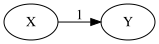

In [44]:
# Generate data
statesDF = generate_ex2_mod(1000, yx_ratio=0.45)

# Run Extended CCM
causalitiesDF, peaksDF = extCCM_wrapper(statesDF[['X', 'Y', 'Z']])

# Visualise results
visualise_results_mod(statesDF, causalitiesDF, peaksDF, threshold=0.5)

In [166]:
plot_causalities(metaCausalitiesDF[1])

## Example 1: Linearly-correlated continuous random variables

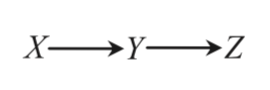

$ 
\begin{align} 
X_k &\sim \mathcal{N}(0, 1) \\
v_{1k}, v_{2k} &\sim \mathcal{N}(0, 0.1) \\
Y_{k+1} &= 0.8 X_k + 0.5 Y_k + v_{1k} \\
Z_{k+1} &= 0.6 Y_k + v_{2k} \\
\\
\text{Such that:} \\
Y_0 &= 3.2
\end{align} 
$

System Time Series





Extended CCM results


,Peak Causality,Peak xMap Lag,URC Causality,URC xMap Lag
X → Y,0.962,-1,0.962,-1
X → Z,0.930,-3,0.929,-2
Y → Z,0.963,-1,0.963,-1


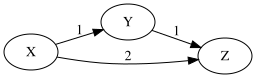

In [159]:
# Generate data
statesDF = generate_ex1(1000)

# Run Extended CCM
causalitiesDF, peaksDF = extCCM_wrapper(statesDF[['X', 'Y', 'Z']])

# Visualise results
visualise_results(statesDF, causalitiesDF, peaksDF, threshold=0.5)

## Example 1 (Modified): Linearly-correlated continuous random variables

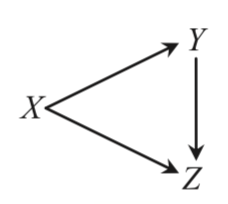

$ 
\begin{align} 
X_k &\sim \mathcal{N}(0, 1) \\
v_{1k}, v_{2k} &\sim \mathcal{N}(0, 0.1) \\
Y_{k+1} &= 0.8 X_k + 0.5 Y_k + v_{1k} \\
Z_{k+1} &= 0.6 Y_k + 0.4 X_k + v_{2k} \\
\\
\text{Such that:} \\
Y_0 &= 3.2
\end{align} 
$

In [13]:
# Generate data
statesDF = generate_ex1_mod(1000, xzDelay=1)

# Run Extended CCM
causalitiesDF, peaksDF = extCCM_wrapper(statesDF[['X', 'Y', 'Z']])

# Visualise results
visualise_results(statesDF, causalitiesDF, peaksDF, threshold=0.5)

System Time Series





Extended CCM results


,Peak Causality,Peak xMap Lag,URC Causality,URC xMap Lag
X → Y,0.962,-1,0.962,-1
X → Z,0.907,-3,0.905,-2
Y → Z,0.957,-3,0.957,-3


## Example 2: Nonlinearly-correlated continuous random variables

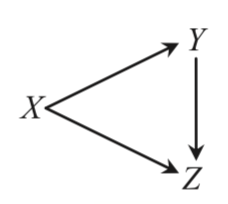

$
\begin{align}
X_k &\in [4, 5] \sim U(4, 5) \\
v_{1k}, v_{2k} &\sim \mathcal{N}(0, 0.0.5) \\
Y_{k+1} &= 1 - 2 \ \left| \ 0.5 - \left( 0.8 X_k + 0.4 \sqrt{\left| \ Y_k \ \right|} \right) \ \right| + v_{1k} \\
Z_{k+1} &= 5 \left( Y_k + 7.2 \right)^2 + 10 \sqrt{\left|X_k \right|} + v_{2k} \\
\\
\text{Such that:} \\
Y_0 &= 0.2
\end{align}
$

System Time Series





Extended CCM results


,Peak Causality,Peak xMap Lag,URC Causality,URC xMap Lag
X → Y,0.982,-1,0.982,-1
X → Z,0.802,-2,0.802,-2
Y → Z,0.832,-2,0.827,-1


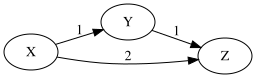

In [303]:
# Generate data
statesDF = generate_ex2(1000)

# Run Extended CCM
causalitiesDF, peaksDF = extCCM_wrapper(statesDF[['X', 'Y', 'Z']])

# Visualise results
visualise_results(statesDF, causalitiesDF, peaksDF, threshold=0.5)

## Example 3: 2x2 MIMO System with Sensor Noise
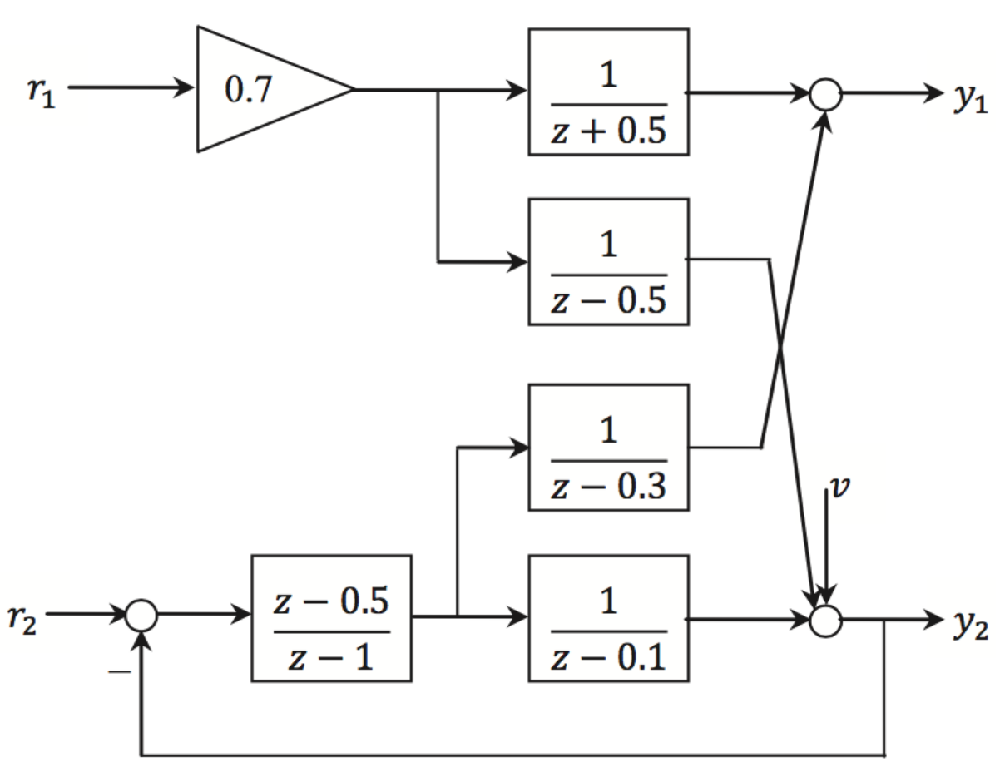

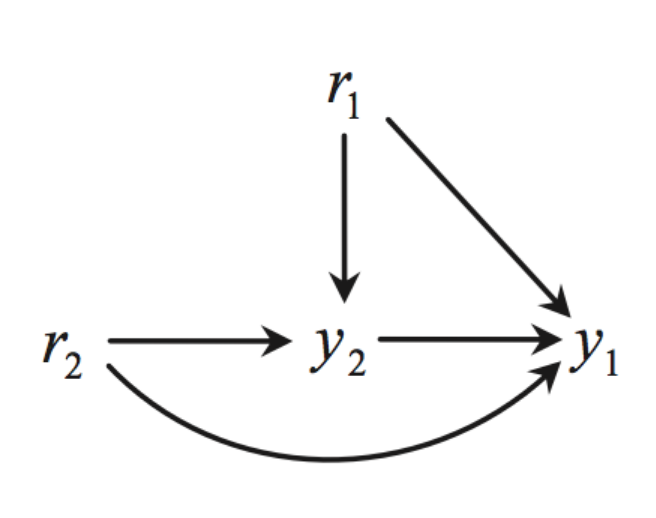

### Net transfer functions:

$
\begin{align}
y_1(s) &= \frac{0.7}{z + 0.5}r_1(s) + \frac{z - 0.5}{z^2 - 1.3 z + 0.3}r_2(s) - \frac{z - 0.5}{z^2 - 1.3z + 0.3} y_2(s) \\
&= \frac{0.7 z^3 - 0.98 z^2 - 0.539 z + 0.119}{z^4 + 0.1 z^3 - 0.57 z^2 - 0.065z + 0.06} r_1(s) + \frac{z^2 - 0.6z + 0.05}{z^3 - 0.4 z^2 - 0.37 z + 0.12} r_2(s) - \frac{z^2 - 0.6z + 0.05}{z^3 - 0.4 z^2 - 0.37 z + 0.12} v(s) \\
\end{align}
$

$
\begin{align}
y_2(s) &= \frac{0.7 z^2 - 0.77z + 0.07}{z^3 - 0.6 z^2 - 0.35z + 0.2} r_1(s) + \frac{z - 0.5}{z^2 - 0.1z - 0.4} r_2(s) + \frac{z^2 - 1.1z + 0.1}{z^2 - 0.1z - 0.4} v(s)
\end{align}
$

where: 

$
\begin{align}
r_1(t), \ r_2(t) &\sim \mathcal{N}(0, 1) \\
v_(t) &\sim \mathcal{N}(0, 0.1)
\end{align}
$

System Time Series





Extended CCM results


,Peak Causality,Peak xMap Lag,URC Causality,URC xMap Lag
r1 → y1,0.660,-3,0.608,-2
r2 → y1,0.586,-4,0.538,-1
y2 → y1,0.823,-3,0.763,0
r2 → y2,0.748,-3,0.724,-1
y1 → y2,0.781,-1,0.768,0


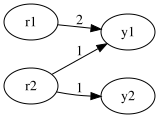

In [304]:
# Generate data
statesDF = generate_ex3()

# Run Extendedo CCM
causalitiesDF, peaksDF = extCCM_wrapper(statesDF[['r1', 'r2', 'y1', 'y2']])

# Visualise results
visualise_results(statesDF, causalitiesDF, peaksDF, threshold=0.5)

## Eastman

In [118]:
def filter_PVs(df, oscillating_only=False):
    '''
    Filter out columns which are not process variables (PVs).
    
    Input:
        df: Pandas dataframe
        
    Returns:
        A copy of df with non-PV columns removed.
    '''
    # Define key for oscillating variables
    osc_var = ['PC1.PV', 'PC2.PV',
               'TC1.PV', 'TC2.PV',
               'FC1.PV', 'FC3.PV', 'FC4.PV', 'FC5.PV', 'FC6.PV', 'FC7.PV', 'FC8.PV',
               'LC1.PV', 'LC2.PV', 'LC3.PV']
        
    # Define empty dataframe
    output = pd.DataFrame()
    
    for field, series in df.iteritems():
        # Filter out non-PV columns
        if ('PV' not in field):
            continue
        
        if (oscillating_only == True) and (field in osc_var):
            output = pd.concat([output, series], axis=1)
            continue
        elif (oscillating_only == False):
            output = pd.concat([output, series], axis=1)
        
    return output

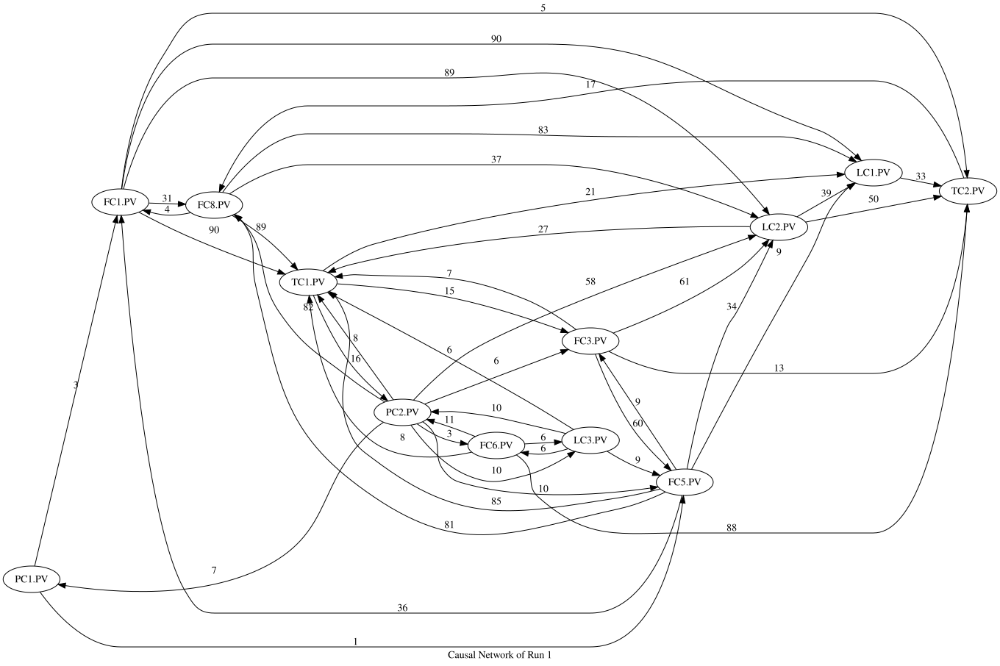

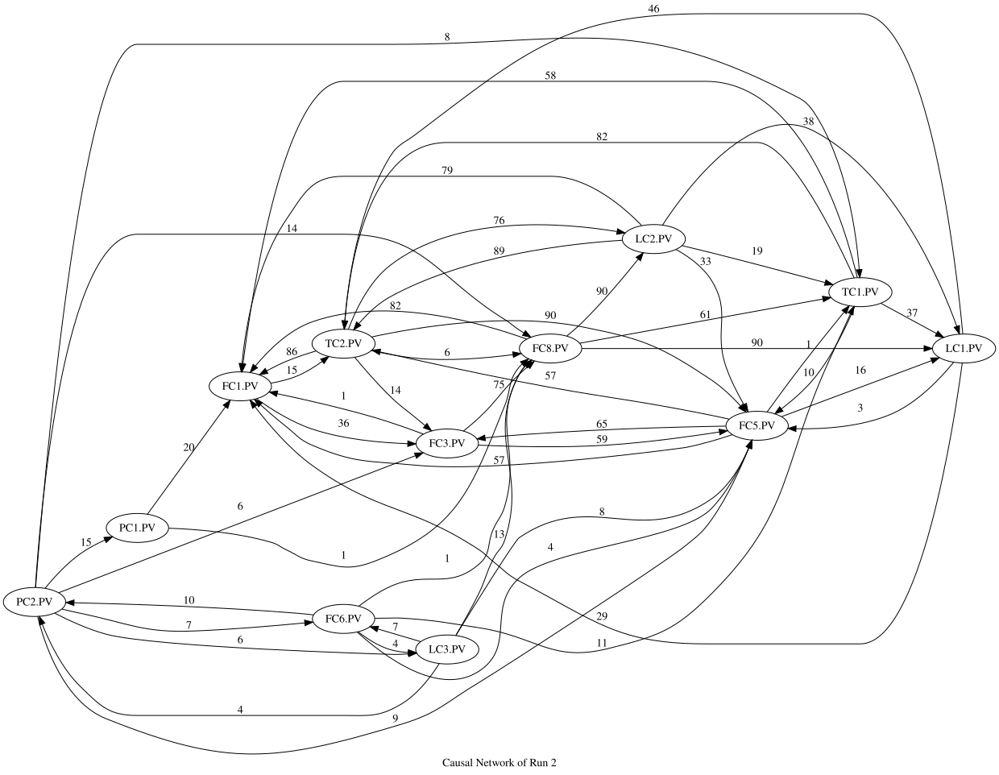

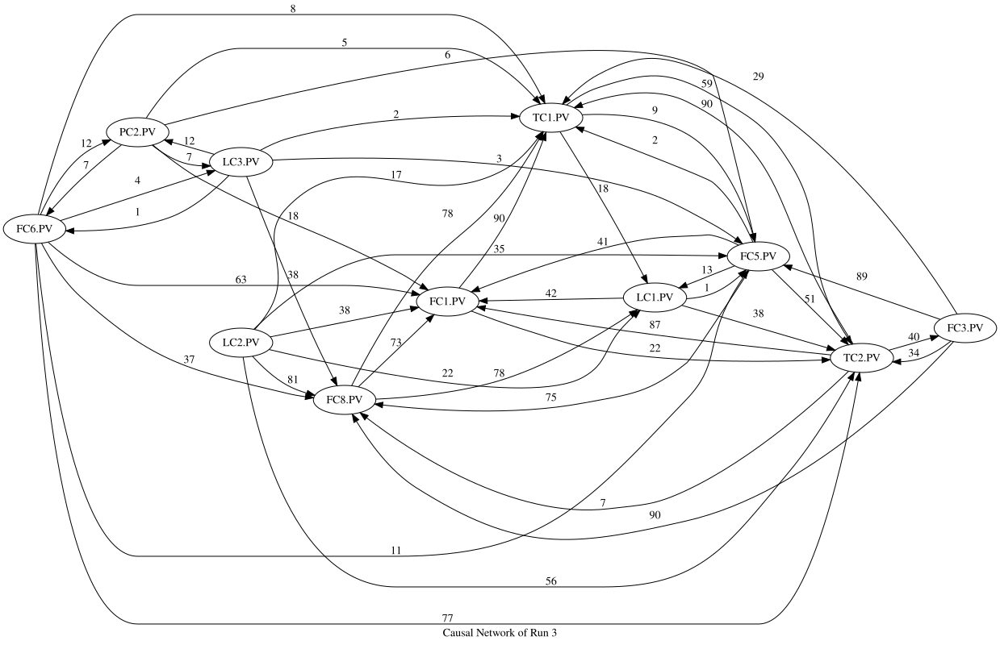

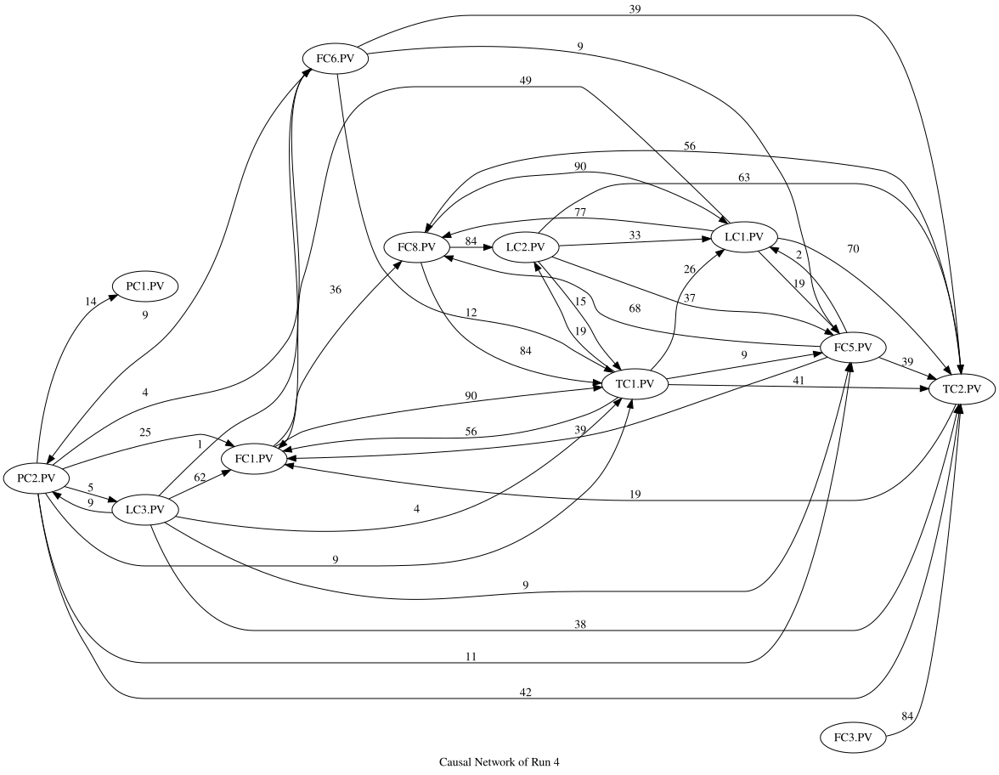

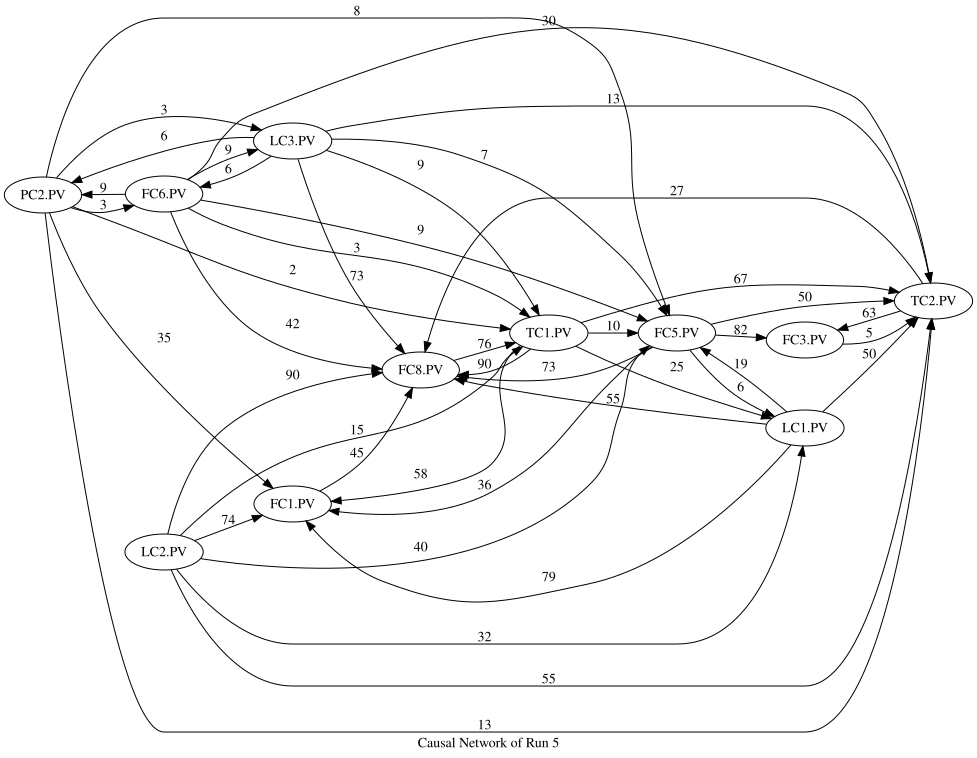

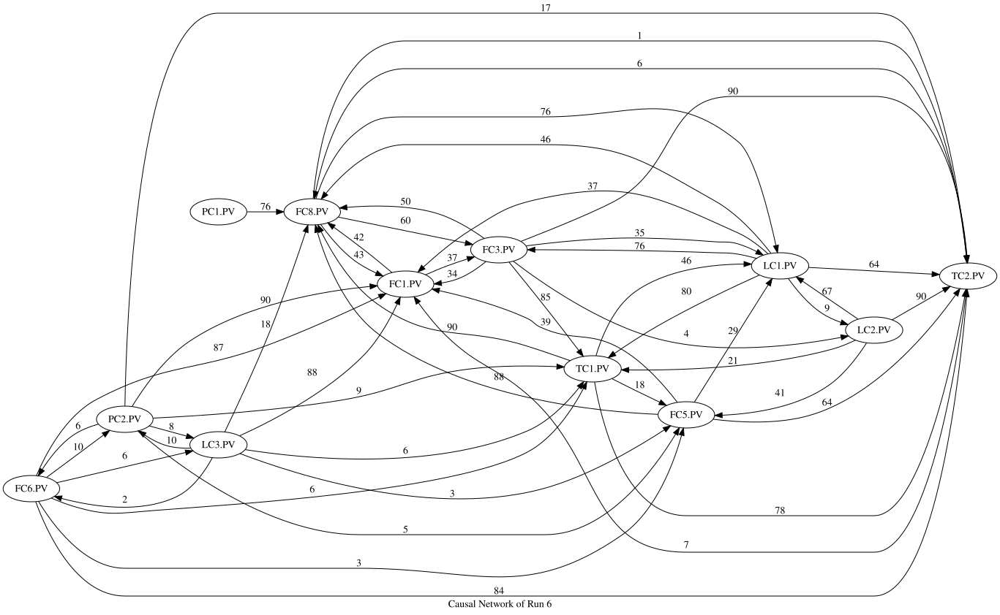

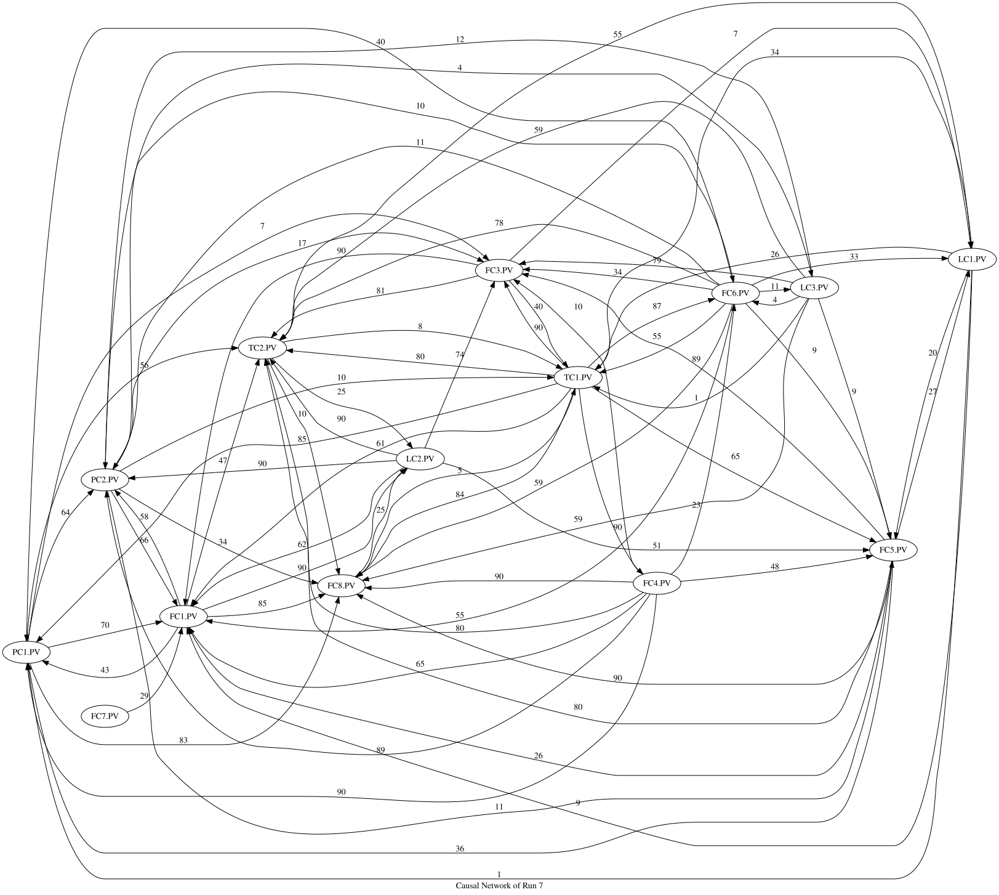

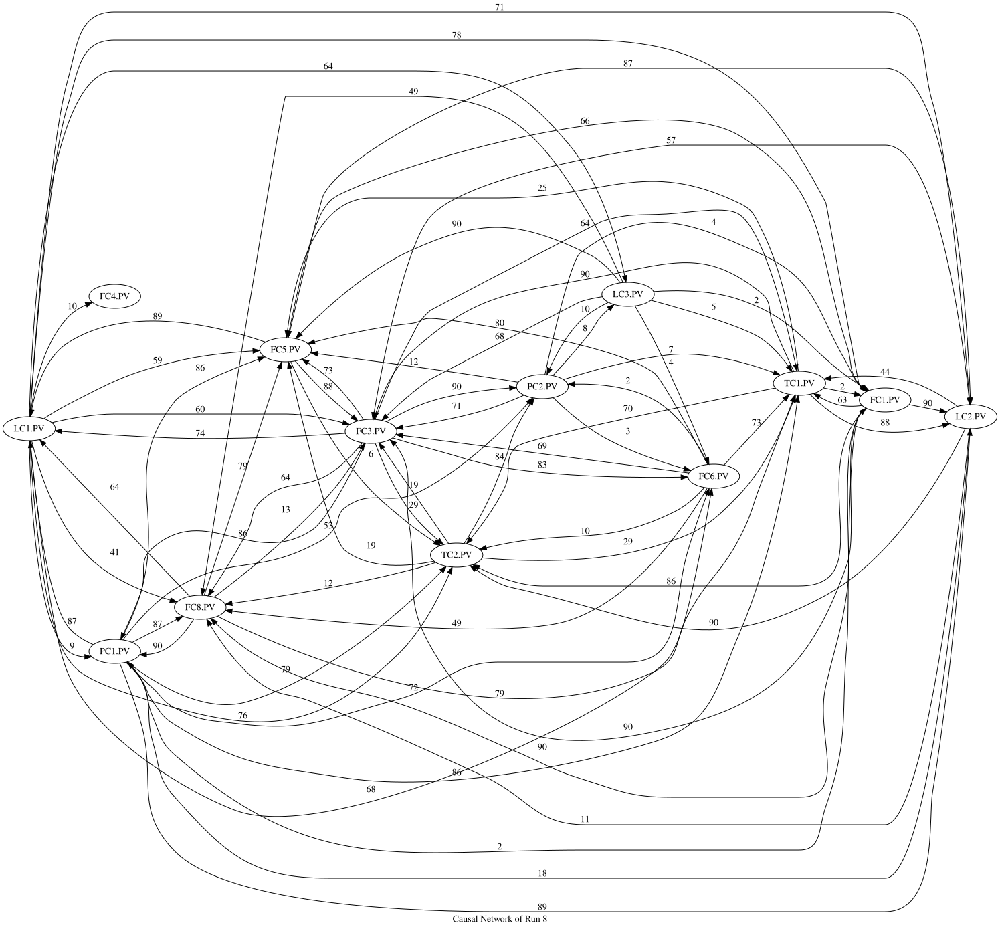

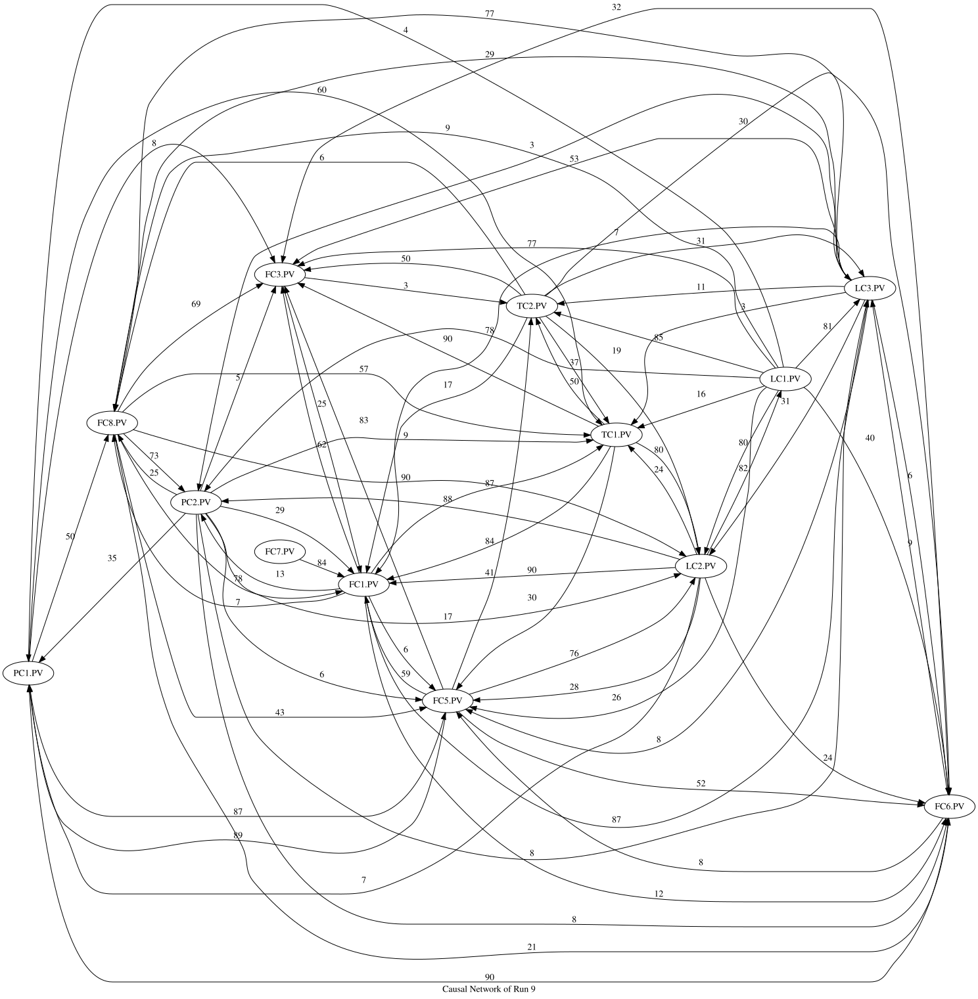

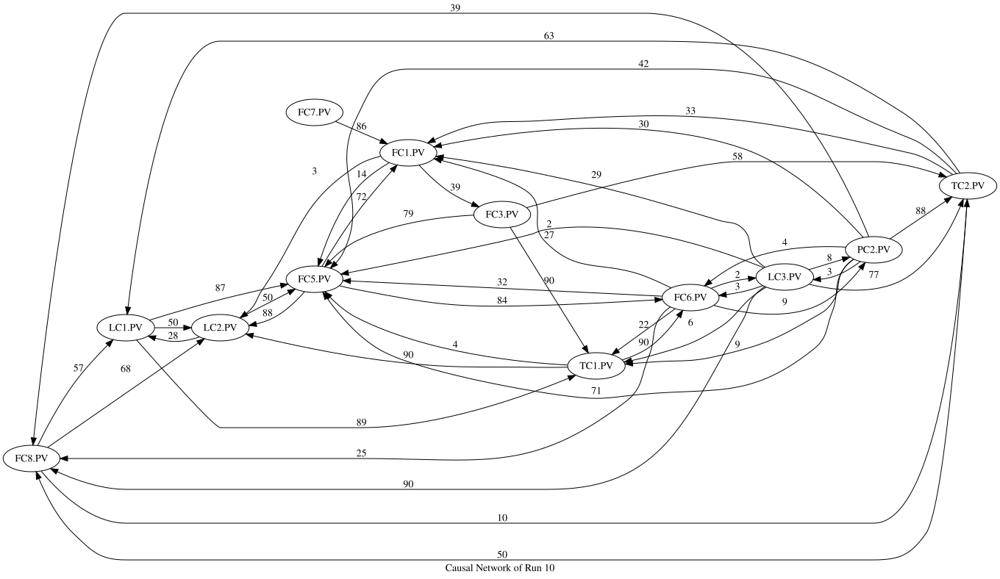

In [318]:
# Load Eastman Data
eastman = pd.read_csv('./Data/eastman.csv')

# Filter out PVs and oscillating process variables
eastman_PVs = filter_PVs(eastman, oscillating_only=True)

# Create empty DataFrame to store all causalities and peaks
metaCausalitiesDF = pd.DataFrame()
metaPeaksDF = pd.DataFrame()

for i in range(10):
    startIdx = int(i * 0.1 * len(eastman_PVs))
    endIdx = int((i + 1) * 0.1 * len(eastman_PVs))
    
    # Run Extended CCM
    causalitiesDF, peaksDF = extCCM_wrapper(eastman_PVs[startIdx:endIdx], 
                                            useAllPoints=True, 
                                            crossMapLags=90)
    
    # Visualise causal network
    display(create_digraph(peaksDF, 
                           criterion='Peak',
                           label = 'Causal Network of Run {}'.format(i + 1),
                           filename='Run {}'.format(i + 1),
                           directory='Results/ECCM_eastman/all_points_xmap_90_peak/'))
    
    # Create multilevel index from `causalitiesDF` and 'peaksDF
    causalitiesDF.columns = pd.MultiIndex.from_product([[i + 1], causalitiesDF.columns], 
                                          names=['Run', 'Edge'])
    
    peaksDF.index = pd.MultiIndex.from_product([[i + 1], peaksDF.index], 
                                          names=['Run', 'Edge'])
    
    # Append `causalitiesDF` and `peaksDF`
    metaCausalitiesDF = pd.concat([metaCausalitiesDF, causalitiesDF], axis=1)
    metaPeaksDF = pd.concat([metaPeaksDF, peaksDF], axis=0)

In [319]:
metaCausalitifesDF.to_csv('./Results/ECCM_eastman/all_points_xmap_90_peak/metaCausalities.csv', index_label='xMap Lag')
metaPeaksDF.to_csv('./Results/ECCM_eastman/all_points_xmap_90_peak/metaPeaks.csv', index_label=['Run', 'Edge'])

## Causal Graph Analysis

### Load Saved DataFrames from csv

In [13]:
metaCausalitiesDF = pd.read_csv('./Results/ECCM_eastman/allPoints_xmap90_peak/metaCausalities.csv',
                                header=[0, 1], 
                                index_col=0)
metaCausalitiesDF.head()

Run                    1                                                  \
Edge     FC3.PV → PC1.PV LC1.PV → PC1.PV FC1.PV → PC1.PV FC4.PV → PC1.PV   
xMap Lag                                                                   
-90             0.078620        0.088744        0.098299       -0.055104   
-89             0.107094        0.088645        0.114674       -0.020158   
-88             0.102295        0.095559        0.125946       -0.050548   
-87             0.091418        0.079291        0.127296       -0.033126   
-86             0.089008        0.054285        0.130176       -0.012803   

Run                                                                       \
Edge     TC1.PV → PC1.PV FC6.PV → PC1.PV PC2.PV → PC1.PV LC3.PV → PC1.PV   
xMap Lag                                                                   
-90            -0.010768        0.128922        0.001211        0.082043   
-89            -0.025835        0.126957        0.019094        0.087470   
-88            -0.041259        0.143798        0.045285        0.078529   
-87            -0.054346        0.122476        0.071741        0.053901   
-86            -0.065748        0.075512        0.116707        0.006915   

Run                                            ...                    10  \
Edge     FC5.PV → PC1.PV LC2.PV → PC1.PV       ...       FC1.PV → FC7.PV   
xMap Lag                                       ...                         
-90             0.136062       -0.038200       ...             -0.109678   
-89             0.139159       -0.043587       ...             -0.114856   
-88             0.150229       -0.037319       ...             -0.117215   
-87             0.150645       -0.040214       ...             -0.122242   
-86             0.152507       -0.041596       ...             -0.127412   

Run                                                                       \
Edge     FC4.PV → FC7.PV TC1.PV → FC7.PV FC6.PV → FC7.PV PC2.PV → FC7.PV   
xMap Lag                                                                   
-90             0.024649       -0.106067        0.022628        0.111255   
-89             0.070160       -0.127220        0.037163        0.095489   
-88             0.094641       -0.134984        0.041593        0.092067   
-87             0.124376       -0.139411        0.053501        0.108288   
-86             0.109897       -0.131502        0.072052        0.110982   

Run                                                                       \
Edge     LC3.PV → FC7.PV FC5.PV → FC7.PV LC2.PV → FC7.PV FC8.PV → FC7.PV   
xMap Lag                                                                   
-90             0.108779       -0.094331       -0.034610        0.189174   
-89             0.115265       -0.095639       -0.033606        0.200966   
-88             0.114323       -0.113059       -0.018127        0.207467   
-87             0.114190       -0.122331       -0.018061        0.213438   
-86             0.130121       -0.149030       -0.019611        0.222349   

Run                       
Edge     TC2.PV → FC7.PV  
xMap Lag                  
-90             0.133426  
-89             0.139472  
-88             0.144232  
-87             0.144460  
-86             0.129015  

[5 rows x 1820 columns]

In [39]:
# Create a list containing LC2 variables
list_containing_LC2 = [x for x in metaCausalitiesDF['1'].columns if 'LC2' in x]

In [55]:
LC2_as_source = [x for x in list_containing_LC2 if 'LC2.PV ' in x]

In [56]:
plot_causalities(metaCausalitiesDF['3'][LC2_as_source])

In [57]:
metaPeaksDF.loc[3].loc[LC2_as_source]

,Peak Causality,Peak xMap Lag,URC Causality,URC xMap Lag
Edge,,,,
LC2.PV → PC1.PV,0.162,26,0.143,42
LC2.PV → FC3.PV,0.806,74,0.722,-65
LC2.PV → LC1.PV,0.787,-22,0.084,55
LC2.PV → FC1.PV,0.924,-38,0.785,20
LC2.PV → FC4.PV,0.311,48,0.290,64
LC2.PV → TC1.PV,0.960,-17,0.836,43
LC2.PV → FC6.PV,0.018,-53,-0.088,20
LC2.PV → PC2.PV,0.291,-2,0.187,33
LC2.PV → LC3.PV,0.059,-62,0.059,-62


In [33]:
# metaPeaksDF = pd.read_csv('./Results/ECCM_eastman/all_points_xmap_90_peak/metaPeaks.csv', header=[0, 1], index_col=0).T
metaPeaksDF = pd.read_csv('./Results/ECCM_eastman/allPoints_xmap90_peak/metaPeaks_xmap90.csv', index_col=[0, 1])
metaPeaksDF.head()

Peak Causality  Peak xMap Lag  URC Causality  \
Run Edge                                                            
1   FC3.PV → PC1.PV           0.417              1          0.251   
    LC1.PV → PC1.PV           0.162             77          0.162   
    FC1.PV → PC1.PV           0.209            -65          0.170   
    FC4.PV → PC1.PV           0.108             35          0.006   
    TC1.PV → PC1.PV           0.263             87          0.197   

                     URC xMap Lag  
Run Edge                           
1   FC3.PV → PC1.PV            35  
    LC1.PV → PC1.PV            77  
    FC1.PV → PC1.PV           -57  
    FC4.PV → PC1.PV           -81  
    TC1.PV → PC1.PV            69

In [31]:
def _URC_cross_map_lags(DF):
    '''
    Calculate the critical cross map lag of each causality series 
    baed on the Upper Right Corner (URC) criteria.

    Critical cross map lag is defined as the cross map lag before
    the lag corresponding to the maximum discrete concativity.
    Concativity can be calculated using discrete first- and second-
    order derivatives.

    Inputs:
        DF: An (N x P) DataFrame containing causalities for P 
            variable pairs at N cross map lags.

    Returns:
        A (P* x 1) DataFrame containing the critical URC cross map
        lags, where 0 <= P* <= P. 
    '''
    # Concatenate first- and second-order derivatives into a 
    # DataFrame with keys 'delta' and 'doubleDelta'
    _derivAllVarsDF = pd.concat([DF.diff(2).shift(-1)/2, DF.shift(-1) + DF.shift(1) - 2 * DF], 
                                axis=1, 
                                keys=['delta', 'doubleDelta'])

    # Create a list to store critical URC cross maps
    URCLags = []

    # Iterate through every variable pair
    for key in DF.columns:
        # Create a (N x 2) DataFrame containing the 
        # first- and second- order derivative of 
        # a single variable pair
        _derivSingleVarDF = _derivAllVarsDF.loc[:, _derivAllVarsDF.columns.get_level_values(1) == key]

        # Calculate critical cross map lag
        # 1. Filter values in _df which are strictly nonpositive
        # 2. Drop rows that contain do not match filter criteria
        # 3. Select 'doubleDelta' column
        # 4. Obtain index of minimum 'doubleDelta' less one,
        #    as a Pandas Series
        try:
            critXMapLag = ((_derivSingleVarDF[_derivSingleVarDF.apply(lambda x: x <= 0)])
                           .dropna())['doubleDelta'].idxmin()
        except ValueError:
            critXMapLag = pd.Series(None, index=[key])

        # Append critical lags to `URCLags`
        URCLags.append(critXMapLag)

    # Create DataFrame of critical lags
    return pd.DataFrame(pd.concat(URCLags), columns=['URC xMap Lags'])

def _peak_causality_coordinates(DF):
    '''
    Calculate the coordinate of causality peak
    for each variable pair in DF. 

    Returns a Pandas DataFrame. 
    '''
    # Create a new Pandas DataFrame
    peakCausalitiesDF = pd.DataFrame()

    # Calculate peak causalities
    peakCausalitiesDF['Peak Causality'] = DF.max().round(3)

    # Obtain peak cross map lag
    peakCausalitiesDF['Peak xMap Lag'] = DF.idxmax()

    # Calculate Upper Right Corner (URC) cross map lag
    peakCausalitiesDF['URC xMap Lag'] = _URC_cross_map_lags(DF)

    # Calculate URC Causality
    URCCausalities = []
    for (index, value) in peakCausalitiesDF['URC xMap Lag'].iteritems():
        # If cross map lag is None, causality is also None
        URCCausalities.append(None if pd.isnull(value) else round(DF.loc[value, index], 3))
    peakCausalitiesDF['URC Causality'] = pd.Series(URCCausalities, index=peakCausalitiesDF.index)

    # Rearrange columns and return DataFrame
    return peakCausalitiesDF[['Peak Causality', 
                              'Peak xMap Lag',
                              'URC Causality',
                              'URC xMap Lag']]

In [41]:
metaCausalitiesDF['1'].loc[-90:-88].head()

Edge,FC3.PV → PC1.PV,LC1.PV → PC1.PV,FC1.PV → PC1.PV,FC4.PV → PC1.PV,TC1.PV → PC1.PV,FC6.PV → PC1.PV,PC2.PV → PC1.PV,LC3.PV → PC1.PV,FC5.PV → PC1.PV,LC2.PV → PC1.PV,...,FC1.PV → FC7.PV,FC4.PV → FC7.PV,TC1.PV → FC7.PV,FC6.PV → FC7.PV,PC2.PV → FC7.PV,LC3.PV → FC7.PV,FC5.PV → FC7.PV,LC2.PV → FC7.PV,FC8.PV → FC7.PV,TC2.PV → FC7.PV
xMap Lag,,,,,,,,,,,,,,,,,,,,,
-90,0.078620,0.088744,0.098299,-0.055104,-0.010768,0.128922,0.001211,0.082043,0.136062,-0.038200,...,0.014527,0.049975,0.058786,0.128263,0.111934,0.128876,0.052792,0.129953,0.111894,-0.048358
-89,0.107094,0.088645,0.114674,-0.020158,-0.025835,0.126957,0.019094,0.087470,0.139159,-0.043587,...,0.016706,0.043715,0.058348,0.115202,0.092580,0.118926,0.045264,0.143313,0.101102,-0.039319
-88,0.102295,0.095559,0.125946,-0.050548,-0.041259,0.143798,0.045285,0.078529,0.150229,-0.037319,...,0.016306,0.031542,0.056922,0.111132,0.054644,0.100499,0.046602,0.135731,0.091856,-0.032428


In [32]:
for xMapLag in [5, 10, 30, 90]:
    metaPeaksDF = pd.DataFrame()
    for chunk in range(10):
        peaksDF = _peak_causality_coordinates(metaCausalitiesDF['{}'.format(chunk + 1)].loc[(-xMapLag):(xMapLag)])

        peaksDF.index = pd.MultiIndex.from_product([[chunk + 1], peaksDF.index], 
                                      names=['Run', 'Edge'])

        metaPeaksDF = pd.concat([metaPeaksDF, peaksDF], axis=0)
    metaPeaksDF.to_csv('./Results/ECCM_eastman/allPoints_xmap{0}_peak/metaPeaks_xmap{0}.csv'.format(xMapLag), index_label=['Run', 'Edge'])
#             create_digraph(peaksDF, 
#                            criterion=criterion, 
#                            label='Causal Network of Run {}'.format(chunk + 1), 
#                            filename='Run {}'.format(chunk + 1), 
#                            directory='./Results/ECCM_eastman/allPoints_xmap{0}_{1}/'.format(xMapLag, criterion.lower()))

In [145]:
def filter_metapeaks(df, criterion='URC', threshold=0.5):
    '''
    Filter variables containing the critical 
    causality and cross map lag from 
    dataframe `df` using `criterion`.
    
    Inputs:
        df:        A DataFrame containing causalities 
                   and critical cross map lags.
        criterion: Criterion by which to filter 
                   variables. 'URC' or 'Peak'
        threshold: Minimal causality value to considered
                   statistically significant. 
    '''
    assert criterion == 'URC' or criterion == 'Peak'
    
    return df[(df['{} Causality'.format(criterion)] >= threshold)
              & (df['{} xMap Lag'.format(criterion)] < 0)]

### Results Comparison between 'Peak' vs. 'URC'

In [290]:
edgesByPeak = pd.DataFrame(sorted(list(filter_metapeaks(metaPeaksDF, criterion='Peak').swaplevel().T), 
                                  key=lambda (x, y): (x, int(y))),
                           columns=['Edge', 'Run'])
#                            columns=pd.MultiIndex.from_product([['Peak'], ['Detected Edge', 'Run #']]))
edgesByURC = pd.DataFrame(sorted(list(filter_metapeaks(metaPeaksDF, criterion='URC').swaplevel().T), 
                                 key=lambda (x, y): (x, int(y))),
                          columns=['Edge', 'Run'])
#                           columns=pd.MultiIndex.from_product([['URC'], ['Detected Edge', 'Run #']]))

edgesMerged = pd.merge(edgesByPeak, edgesByURC, on=['Edge', 'Run']).set_index('Edge')
# edgesByPeak.join(edgesByURC, on='Edge', how='inner', lsuffix='Left', rsuffix='Right')

In [203]:
print '# of Edges for Peak: {}'.format(len(edgesByPeak))
print '# of Edges for URC: {}'.format(len(edgesByURC))
print '# of Edges for Merged DataFrame: {}'.format(len(edgesMerged))

# of Edges for Peak: 196
# of Edges for URC: 69
# of Edges for Merged DataFrame: 42


In [222]:
def venn_diagram_overlap():
    '''
    Hard-coded function to depict overlap between sets in dataset.
    
    Code obtained from Plotly example.
    https://plot.ly/python/shapes/#venn-diagram-with-circle-shapes
    '''
    trace0 = go.Scatter(
        x=[0.8, 1.65, 2.2],
        y=[1, 1, 1],
        text=['Peak', 'Peak + URC', 'URC'],
        mode='text',
        textfont=dict(
            color='black',
            size=18,
            family='Arail',
        )
    )

    data = [trace0]

    layout = {
        'xaxis': {
            'showticklabels': False,
            'autotick': False,
            'showgrid': False,
            'zeroline': False,
        },
        'yaxis': {
            'showticklabels': False,
            'autotick': False,
            'showgrid': False,
            'zeroline': False,
        },
        'shapes': [
            {
                'opacity': 0.3,
                'xref': 'x',
                'yref': 'y',
                'fillcolor': 'blue',
                'x0': 0,
                'y0': 0,
                'x1': 2,
                'y1': 2,
                'type': 'circle',
                'line': {
                    'color': 'blue',
                },
            },
            {
                'opacity': 0.3,
                'xref': 'x',
                'yref': 'y',
                'fillcolor': 'gray',
                'x0': 1.2,
                'y0': 0.4,
                'x1': 2.4,
                'y1': 1.6,
                'type': 'circle',
                'line': {
                    'color': 'gray',
                },
            }
        ],
        'margin': {
            't': 20,
            'l': 20,
            'r': 20,
            'b': 20
        },
        'height': 400,
        'width': 600,
    }
    fig = {
        'data': data,
        'layout': layout,
    }

    pyo.iplot(fig)

venn_diagram_overlap()

### How many nodes remain in each run?

In [279]:
edgesByPeak.loc[0, 'Run'] = ['13','2']

In [280]:
edgesByPeak

,Edge,Run
0,FC3.PV → FC5.PV,"[13, 2]"
1,FC3.PV → FC5.PV,2
2,FC3.PV → FC5.PV,3
3,FC3.PV → FC5.PV,7
4,FC3.PV → FC5.PV,8
5,FC3.PV → FC5.PV,10
6,FC3.PV → FC6.PV,8
7,FC3.PV → LC2.PV,1
8,FC3.PV → LC2.PV,10
9,FC3.PV → PC1.PV,8


In [283]:
edgesByPeak = edgesByPeak.astype('object')

In [292]:
list(edgesByPeak.groupby('Run'))

[('1',                 Edge Run
  0    FC3.PV → FC5.PV   1
  7    FC3.PV → LC2.PV   1
  11   FC3.PV → TC1.PV   1
  26   FC5.PV → LC2.PV   1
  32   FC5.PV → TC1.PV   1
  49   FC6.PV → PC2.PV   1
  58   FC6.PV → TC1.PV   1
  79   LC2.PV → TC1.PV   1
  96   LC3.PV → FC6.PV   1
  106  LC3.PV → PC2.PV   1
  116  LC3.PV → TC1.PV   1
  132  PC2.PV → FC3.PV   1
  135  PC2.PV → FC5.PV   1
  145  PC2.PV → FC6.PV   1
  156  PC2.PV → LC3.PV   1
  166  PC2.PV → TC1.PV   1), ('10',                 Edge Run
  5    FC3.PV → FC5.PV  10
  8    FC3.PV → LC2.PV  10
  17   FC3.PV → TC1.PV  10
  29   FC5.PV → LC2.PV  10
  46   FC6.PV → LC3.PV  10
  57   FC6.PV → PC2.PV  10
  66   FC6.PV → TC1.PV  10
  76   LC2.PV → FC5.PV  10
  95   LC3.PV → FC5.PV  10
  105  LC3.PV → FC6.PV  10
  115  LC3.PV → PC2.PV  10
  123  LC3.PV → TC1.PV  10
  144  PC2.PV → FC5.PV  10
  154  PC2.PV → FC6.PV  10
  165  PC2.PV → LC3.PV  10
  175  PC2.PV → TC1.PV  10
  188  TC1.PV → FC5.PV  10
  193  TC1.PV → LC2.PV  10), ('2',         

In [298]:
edgesByPeak['Split'] = edgesByPeak['Edge'].apply(lambda x: set(re.split(' → ', x)))

In [310]:
edgesByPeak.groupby('Run')['Split'].agg(lambda x: set(x))

TypeError: unhashable type: 'set'

In [291]:
for item in edgesByPeak.groupby('Run'):
    print item

('1',                 Edge Run
0    FC3.PV → FC5.PV   1
7    FC3.PV → LC2.PV   1
11   FC3.PV → TC1.PV   1
26   FC5.PV → LC2.PV   1
32   FC5.PV → TC1.PV   1
49   FC6.PV → PC2.PV   1
58   FC6.PV → TC1.PV   1
79   LC2.PV → TC1.PV   1
96   LC3.PV → FC6.PV   1
106  LC3.PV → PC2.PV   1
116  LC3.PV → TC1.PV   1
132  PC2.PV → FC3.PV   1
135  PC2.PV → FC5.PV   1
145  PC2.PV → FC6.PV   1
156  PC2.PV → LC3.PV   1
166  PC2.PV → TC1.PV   1)
('10',                 Edge Run
5    FC3.PV → FC5.PV  10
8    FC3.PV → LC2.PV  10
17   FC3.PV → TC1.PV  10
29   FC5.PV → LC2.PV  10
46   FC6.PV → LC3.PV  10
57   FC6.PV → PC2.PV  10
66   FC6.PV → TC1.PV  10
76   LC2.PV → FC5.PV  10
95   LC3.PV → FC5.PV  10
105  LC3.PV → FC6.PV  10
115  LC3.PV → PC2.PV  10
123  LC3.PV → TC1.PV  10
144  PC2.PV → FC5.PV  10
154  PC2.PV → FC6.PV  10
165  PC2.PV → LC3.PV  10
175  PC2.PV → TC1.PV  10
188  TC1.PV → FC5.PV  10
193  TC1.PV → LC2.PV  10)
('2',                 Edge Run
1    FC3.PV → FC5.PV   2
12   FC3.PV → TC1.PV   2
50  

In [285]:
edgesByPeak.groupby('Run').apply(lambda x: set(re.split(' → ', x)))

TypeError: unhashable type: 'list'

In [238]:
set(x for sublist in edgesByPeak['Edge'].apply(lambda x: re.split(' → ', x)) for x in sublist)

9

In [198]:
print ''

(42, 1)

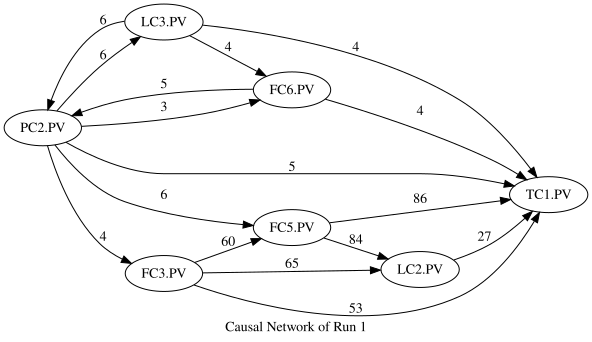

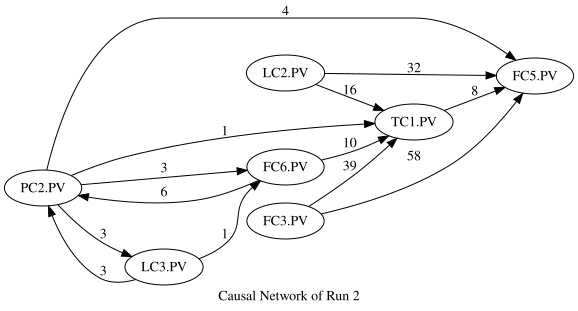

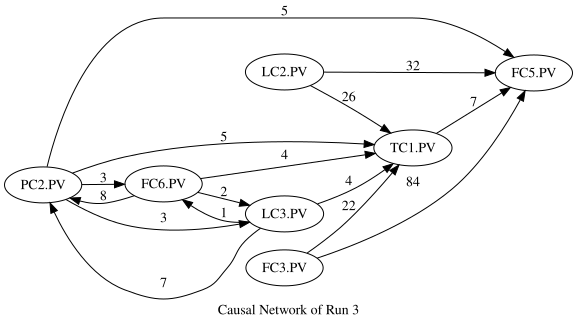

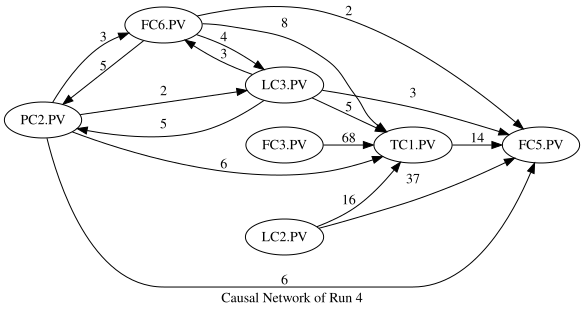

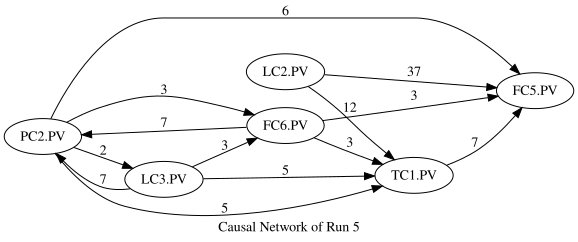

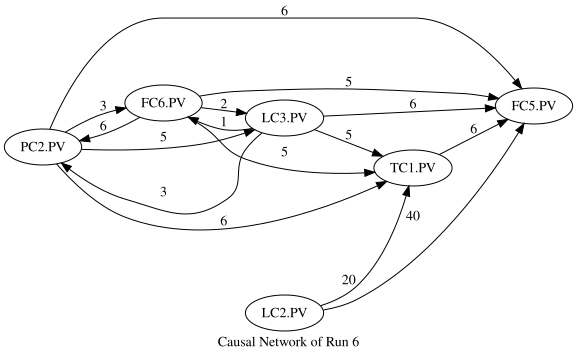

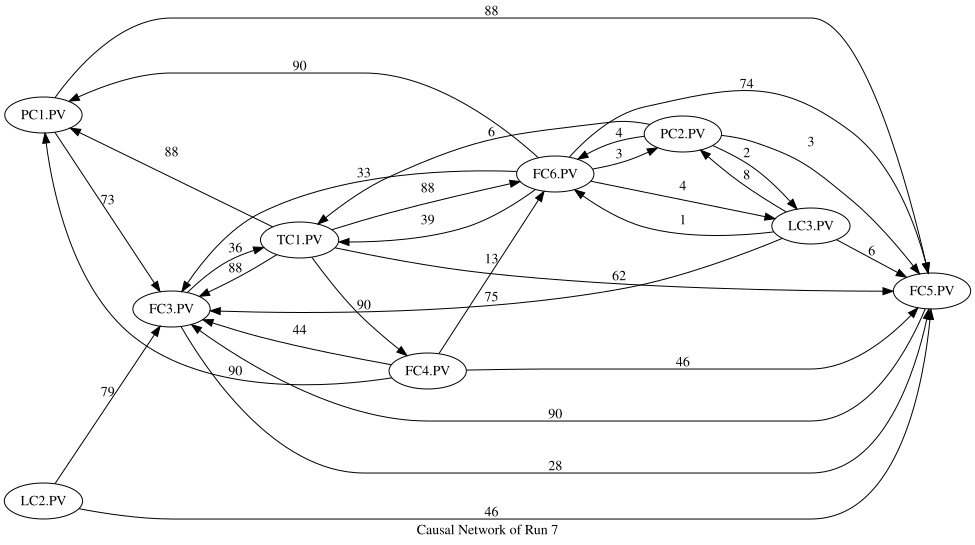

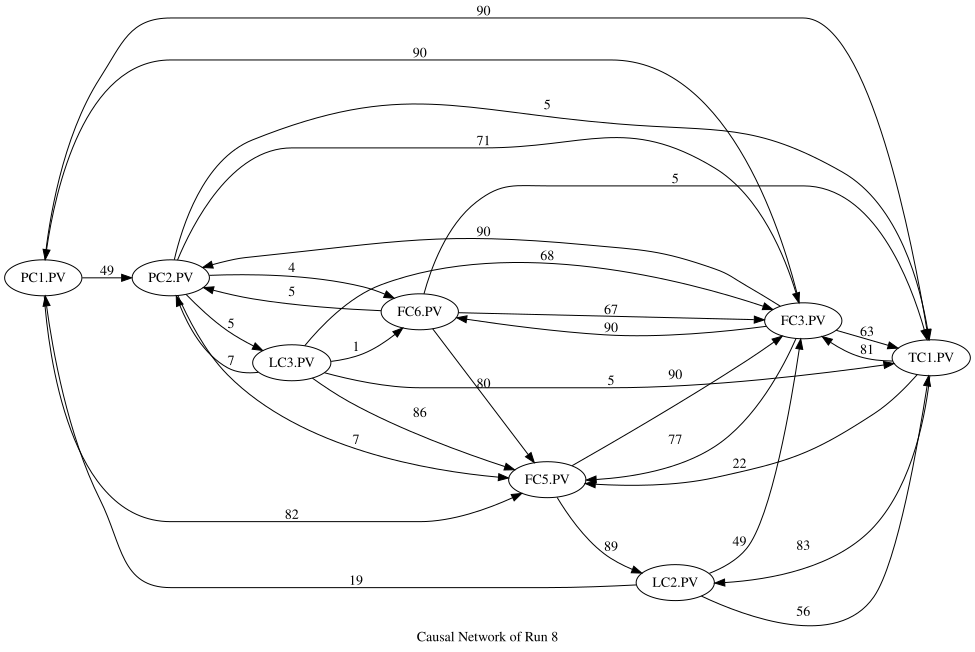

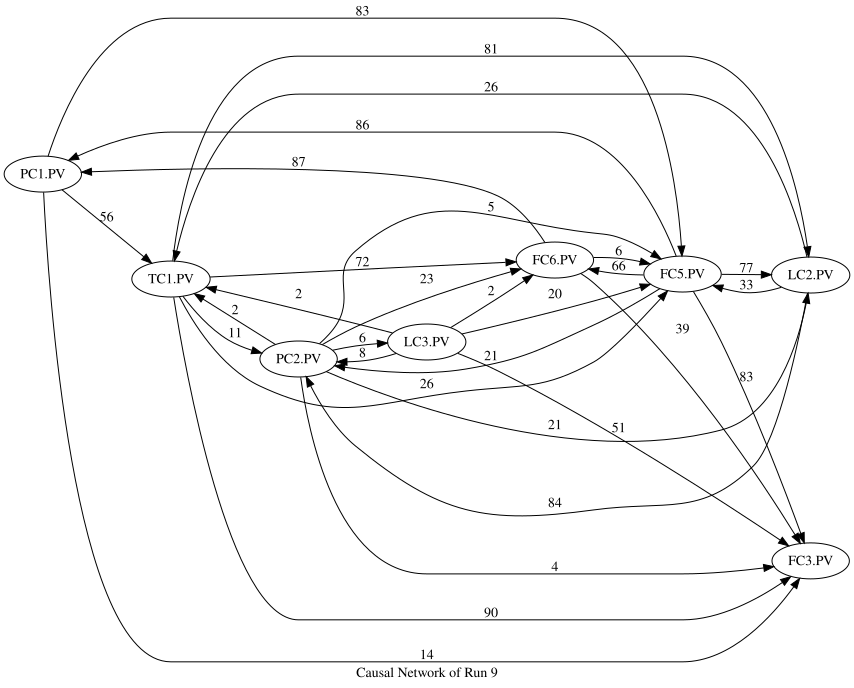

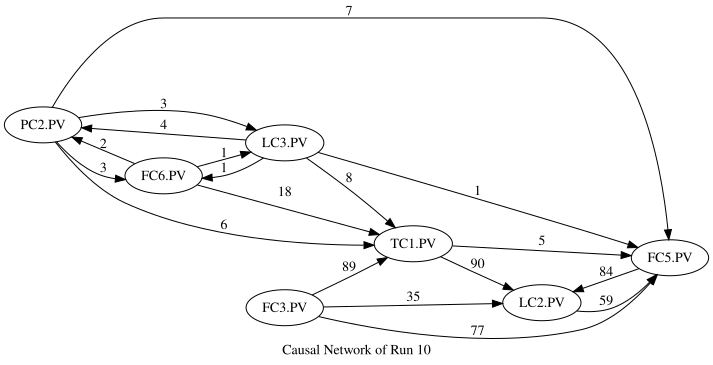

In [175]:
# Load Eastman Data
eastman = pd.read_csv('./Data/eastman.csv')

# Filter out PVs and oscillating process variables
eastman_PVs = filter_PVs(eastman, oscillating_only=True)

# Create empty DataFrame to store all causalities and peaks
metaCausalitiesDF = pd.DataFrame()
metaPeaksDF = pd.DataFrame()

for i in range(10):
    startIdx = int(i * 0.1 * len(eastman_PVs))
    endIdx = int((i + 1) * 0.1 * len(eastman_PVs))
    
    # Run Extended CCM
    causalitiesDF, peaksDF = extCCM_wrapper(eastman_PVs[startIdx:endIdx], 
                                            useAllPoints=True, 
                                            crossMapLags=90)
    
    # Visualise causal network
    display(create_digraph(peaksDF, 
                           criterion='Peak',
                           label = 'Causal Network of Run {}'.format(i + 1),
                           filename='Run {}'.format(i + 1),
                           directory='Results/ECCM_eastman/all_points_xmap_90_peak/'))
    
    # Create multilevel index from `causalitiesDF` and 'peaksDF
    causalitiesDF.columns = pd.MultiIndex.from_product([[i + 1], causalitiesDF.columns], 
                                          names=['Run', 'Edge'])
    peaksDF = peaksDF.T
    peaksDF.columns = pd.MultiIndex.from_product([[i + 1], peaksDF.columns], 
                                          names=['Run', 'Edge'])
    
    # Append `causalitiesDF` and `peaksDF`
    metaCausalitiesDF = pd.concat([metaCausalitiesDF, causalitiesDF], axis=1)
    metaPeaksDF = pd.concat([metaPeaksDF, peaksDF], axis=1)

In [26]:
metaCausalitiesDF.to_csv('./Results/ECCM_eastman/all_points_xmap_90_peak/metaCausalities.csv', index_label='xMap Lag')
metaPeaksDF.to_csv('./Results/ECCM_eastman/all_points_xmap_90_peak/metaPeaks.csv')

NameError: name 'metaPeaksDF' is not defined

In [196]:
?pd.merge

In [188]:
edgesByPeak

,Edge,Peak Run #
0,FC3.PV → FC5.PV,1
1,FC3.PV → FC5.PV,2
2,FC3.PV → FC5.PV,3
3,FC3.PV → FC5.PV,7
4,FC3.PV → FC5.PV,8
5,FC3.PV → FC5.PV,10
6,FC3.PV → FC6.PV,8
7,FC3.PV → LC2.PV,1
8,FC3.PV → LC2.PV,10
9,FC3.PV → PC1.PV,8


In [189]:
edgesByURC

,Edge,URC Run #
0,FC3.PV → FC5.PV,1
1,FC3.PV → FC5.PV,3
2,FC3.PV → FC5.PV,7
3,FC3.PV → FC5.PV,9
4,FC3.PV → FC6.PV,9
5,FC3.PV → TC1.PV,3
6,FC3.PV → TC1.PV,6
7,FC3.PV → TC1.PV,8
8,FC3.PV → TC1.PV,9
9,FC3.PV → TC1.PV,10


In [ ]:
metaPeaksDF

In [104]:
plot_causalities(metaCausalitiesDF['1'].iloc[:, :45])

In [105]:
plot_causalities(metaCausalitiesDF['1'].iloc[:, 45:])

In [ ]:
plot_causalities(causalitiesDF[[col for col in causalitiesDF.columns if 'LC2.PV' in col]])

In [12]:
list(eastman_PVs)

['PC1.PV',
 'FC3.PV',
 'FC4.PV',
 'TC1.PV',
 'FC6.PV',
 'PC2.PV',
 'LC3.PV',
 'FC5.PV',
 'LC2.PV',
 'FC7.PV']

In [42]:
multiple_scatter(eastman_PVs.columns, range(len(eastman_PVs)), *eastman_PVs.values.T)

In [186]:
# Load Eastman Data
eastman = pd.read_csv('./Data/eastman.csv')

# Filter out PVs and oscillating process variables
eastman_PVs = filter_PVs(eastman, oscillating_only=True)

# Run Extended CCM
causalitiesDF, peaksDF = extCCM_wrapper(eastman_PVs[['LC2.PV', 'TC1.PV']].iloc[::2])

# Visualise results
cols = [col for col in causalitiesDF.columns if 'LC2' in col]
plot_causalities(causalitiesDF[cols])